# Diaptera wings classification using Topological Data Analysis

Guilherme Vituri F. Pinto [](https://orcid.org/0000-0002-7813-8777) (Unesp)  
Sergio UraNorthonApril 15, 2025

We studied etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc etc

In [1]:
using TDAfly, TDAfly.Preprocessing, TDAfly.TDA, TDAfly.Analysis
using Images: mosaicview
using Plots: plot, display, heatmap, scatter
using PersistenceDiagrams

Precompiling packages...
   3570.9 ms  ✓ TDAfly
  1 dependency successfully precompiled in 5 seconds. 397 already precompiled.

## 1 Introduction

Falar sobre o dataset, TDA, etc.

## 2 Methods

All images are in the `images/processed` directory. For each image, we load it, apply a gaussian blur, crop and make it have 150 pixels of height. The blurring step is necessary to “glue” small holes in the figure and keep it connected.

In [2]:
paths = readdir("images/processed", join = true)
species = basename.(paths) .|> (x -> replace(x, ".png" => ""))
individuals = map(species) do specie
  s = split(specie, " ")
  s[1][1] * "-" * s[2]
end
wings = load_wing.(paths, blur = 1.3)
Xs = map(image_to_r2, wings);


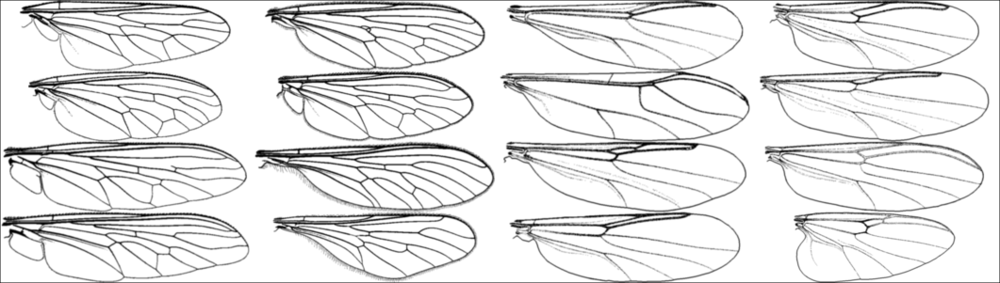

In [3]:
mosaicview(wings, ncol = 4, fillvalue=1)

### 2.1 Vietoris-Rips filtration

We select 500 points from each image using a farthest point sample method

In [4]:
samples = map(Xs) do X
  ids = farthest_points_sample(X, 500)
  X[ids]
end;

Progress:   0%|▏                                        |  ETA: 0:00:53Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress:  97%|███████████████████████████████████████▋ |  ETA: 0:00:00Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress:  88%|████████████████████████████████████     |  ETA: 0:00:00Progress: 100%|█████████████████████████████████████████| Time: 0:00:00

We then calculate its persistence diagrams using the Vietoris-Rips filtration etc.

In [5]:
# get only the 1-dimensional PD
rips = rips_pd.(samples, cutoff = 5, threshold = 200) .|> last;

We create the 1-dimensional persistence image for each persistence diagram using 10x10 matrices

In [6]:
PI = PersistenceImage(rips, size = (10, 10))

images_rips = PI.(rips);

### 2.2 Examples

Below are some examples of 1-dimensional barcodes, its persistence image and the original wing that generated it. Note: we are plotting the barcode using the birth and persistence.

In [7]:
# plot some images to see the barcodes
map([1, 4, 8, 10, 15]) do i
  p = plot_wing_with_pd(rips[i], images_rips[i], samples[i], species[i])
  display(p)
end;

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip160)" d="M466.042 928.945 Q462.431 928.945 460.602 932.51 Q458.796 936.051 458.796 943.181 Q458.796 950.287 460.602 953.852 Q462.431 957.394 466.042 957.394 Q469.676 957.394 471.482 953.852 Q473.31 950.287 473.31 943.181 Q473.31 936.051 471.482 932.51 Q469.676 928.945 466.042 928.945 M466.042 925.241 Q471.852 925.241 474.907 929.848 Q477.986 934.431 477.986 943.181 Q477.986 951.908 474.907 956.514 Q471.852 961.097 466.042 961.097 Q460.232 961.097 457.153 956.514 Q454.097 951.908 454.097 943.181 Q454.097 934.431 457.153 929.848 Q460.232 925.241 466.042 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip160)" d="M596.671 928.945 Q593.06 928.945 591.231 932.51 Q589.425 936.051 589.425 943.181 Q589.425 950.287 591.231 953.852 Q593.06 957.394 596.671 957.394 Q600.305 957.394 602.111 953.852 Q603.939 950.287 603.939 943.181 Q603.939 936.051 602.111 932.51 Q600.305 928.945 596.671 928.945 M596.671 925.241 Q602.481 925.241 605.536 929.848 Q608.615 934.431 608.615 943.181 Q608.615 951.908 605.536 956.514 Q602.481 961.097 596.671 961.097 Q590.861 961.097 587.782 956.514 Q584.726 951.908 584.726 943.181 Q584.726 934.431 587.782 929.848 Q590.861 925.241 596.671 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip160)" d="M677.994 956.491 L694.314 956.491 L694.314 960.426 L672.369 960.426 L672.369 956.491 Q675.032 953.736 679.615 949.107 Q684.221 944.454 685.402 943.111 Q687.647 940.588 688.527 938.852 Q689.43 937.093 689.43 935.403 Q689.43 932.649 687.485 930.912 Q685.564 929.176 682.462 929.176 Q680.263 929.176 677.809 929.94 Q675.379 930.704 672.601 932.255 L672.601 927.533 Q675.425 926.399 677.879 925.82 Q680.332 925.241 682.369 925.241 Q687.74 925.241 690.934 927.926 Q694.129 930.612 694.129 935.102 Q694.129 937.232 693.318 939.153 Q692.531 941.051 690.425 943.644 Q689.846 944.315 686.744 947.533 Q683.643 950.727 677.994 956.491 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip160)" d="M714.129 928.945 Q710.517 928.945 708.689 932.51 Q706.883 936.051 706.883 943.181 Q706.883 950.287 708.689 953.852 Q710.517 957.394 714.129 957.394 Q717.763 957.394 719.568 953.852 Q721.397 950.287 721.397 943.181 Q721.397 936.051 719.568 932.51 Q717.763 928.945 714.129 928.945 M714.129 925.241 Q719.939 925.241 722.994 929.848 Q726.073 934.431 726.073 943.181 Q726.073 951.908 722.994 956.514 Q719.939 961.097 714.129 961.097 Q708.318 961.097 705.24 956.514 Q702.184 951.908 702.184 943.181 Q702.184 934.431 705.24 929.848 Q708.318 925.241 714.129 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip160)" d="M804.654 941.792 Q808.01 942.51 809.885 944.778 Q811.783 947.047 811.783 950.38 Q811.783 955.496 808.265 958.297 Q804.746 961.097 798.265 961.097 Q796.089 961.097 793.774 960.658 Q791.482 960.241 789.029 959.384 L789.029 954.871 Q790.973 956.005 793.288 956.584 Q795.603 957.162 798.126 957.162 Q802.524 957.162 804.816 955.426 Q807.13 953.69 807.13 950.38 Q807.13 947.324 804.978 945.611 Q802.848 943.875 799.029 943.875 L795.001 943.875 L795.001 940.033 L799.214 940.033 Q802.663 940.033 804.492 938.667 Q806.32 937.278 806.32 934.686 Q806.32 932.024 804.422 930.612 Q802.547 929.176 799.029 929.176 Q797.107 929.176 794.908 929.593 Q792.709 930.01 790.07 930.889 L790.07 926.723 Q792.732 925.982 795.047 925.612 Q797.385 925.241 799.445 925.241 Q804.769 925.241 807.871 927.672 Q810.973 930.079 810.973 934.199 Q810.973 937.07 809.329 939.061 Q807.686 941.028 804.654 941.792 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip160)" d="M830.649 928.945 Q827.038 928.945 825.209 932.51 Q823.403 936.051 823.403 943.181 Q823.403 950.287 825.209 953.852 Q827.038 957.394 830.649 957.394 Q834.283 957.394 836.089 953.852 Q837.917 950.287 837.917 943.181 Q

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip250)" d="M466.042 928.945 Q462.431 928.945 460.602 932.51 Q458.796 936.051 458.796 943.181 Q458.796 950.287 460.602 953.852 Q462.431 957.394 466.042 957.394 Q469.676 957.394 471.482 953.852 Q473.31 950.287 473.31 943.181 Q473.31 936.051 471.482 932.51 Q469.676 928.945 466.042 928.945 M466.042 925.241 Q471.852 925.241 474.907 929.848 Q477.986 934.431 477.986 943.181 Q477.986 951.908 474.907 956.514 Q471.852 961.097 466.042 961.097 Q460.232 961.097 457.153 956.514 Q454.097 951.908 454.097 943.181 Q454.097 934.431 457.153 929.848 Q460.232 925.241 466.042 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip250)" d="M573.88 928.945 Q570.269 928.945 568.44 932.51 Q566.635 936.051 566.635 943.181 Q566.635 950.287 568.44 953.852 Q570.269 957.394 573.88 957.394 Q577.514 957.394 579.32 953.852 Q581.148 950.287 581.148 943.181 Q581.148 936.051 579.32 932.51 Q577.514 928.945 573.88 928.945 M573.88 925.241 Q579.69 925.241 582.746 929.848 Q585.824 934.431 585.824 943.181 Q585.824 951.908 582.746 956.514 Q579.69 961.097 573.88 961.097 Q568.07 961.097 564.991 956.514 Q561.935 951.908 561.935 943.181 Q561.935 934.431 564.991 929.848 Q568.07 925.241 573.88 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip250)" d="M632.413 956.491 L648.732 956.491 L648.732 960.426 L626.788 960.426 L626.788 956.491 Q629.45 953.736 634.033 949.107 Q638.639 944.454 639.82 943.111 Q642.065 940.588 642.945 938.852 Q643.848 937.093 643.848 935.403 Q643.848 932.649 641.903 930.912 Q639.982 929.176 636.88 929.176 Q634.681 929.176 632.227 929.94 Q629.797 930.704 627.019 932.255 L627.019 927.533 Q629.843 926.399 632.297 925.82 Q634.751 925.241 636.788 925.241 Q642.158 925.241 645.352 927.926 Q648.547 930.612 648.547 935.102 Q648.547 937.232 647.737 939.153 Q646.95 941.051 644.843 943.644 Q644.264 944.315 641.163 947.533 Q638.061 950.727 632.413 956.491 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip250)" d="M668.547 928.945 Q664.936 928.945 663.107 932.51 Q661.301 936.051 661.301 943.181 Q661.301 950.287 663.107 953.852 Q664.936 957.394 668.547 957.394 Q672.181 957.394 673.986 953.852 Q675.815 950.287 675.815 943.181 Q675.815 936.051 673.986 932.51 Q672.181 928.945 668.547 928.945 M668.547 925.241 Q674.357 925.241 677.412 929.848 Q680.491 934.431 680.491 943.181 Q680.491 951.908 677.412 956.514 Q674.357 961.097 668.547 961.097 Q662.737 961.097 659.658 956.514 Q656.602 951.908 656.602 943.181 Q656.602 934.431 659.658 929.848 Q662.737 925.241 668.547 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip250)" d="M736.281 941.792 Q739.637 942.51 741.512 944.778 Q743.41 947.047 743.41 950.38 Q743.41 955.496 739.892 958.297 Q736.373 961.097 729.892 961.097 Q727.716 961.097 725.401 960.658 Q723.11 960.241 720.656 959.384 L720.656 954.871 Q722.6 956.005 724.915 956.584 Q727.23 957.162 729.753 957.162 Q734.151 957.162 736.443 955.426 Q738.758 953.69 738.758 950.38 Q738.758 947.324 736.605 945.611 Q734.475 943.875 730.656 943.875 L726.628 943.875 L726.628 940.033 L730.841 940.033 Q734.29 940.033 736.119 938.667 Q737.947 937.278 737.947 934.686 Q737.947 932.024 736.049 930.612 Q734.174 929.176 730.656 929.176 Q728.735 929.176 726.535 929.593 Q724.336 930.01 721.698 930.889 L721.698 926.723 Q724.36 925.982 726.674 925.612 Q729.012 925.241 731.073 925.241 Q736.397 925.241 739.498 927.672 Q742.6 930.079 742.6 934.199 Q742.6 937.07 740.957 939.061 Q739.313 941.028 736.281 941.792 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip250)" d="M762.276 928.945 Q758.665 928.945 756.836 932.51 Q755.031 936.051 755.031 943.181 Q755.031 950.287 756.836 953.852 Q758.665 957.394 762.276 957.394 Q765.91 957.394 767.716 953.852 Q769.545 950.287 769.545 943.181 Q769.545 936

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip340)" d="M466.042 928.945 Q462.431 928.945 460.602 932.51 Q458.796 936.051 458.796 943.181 Q458.796 950.287 460.602 953.852 Q462.431 957.394 466.042 957.394 Q469.676 957.394 471.482 953.852 Q473.31 950.287 473.31 943.181 Q473.31 936.051 471.482 932.51 Q469.676 928.945 466.042 928.945 M466.042 925.241 Q471.852 925.241 474.907 929.848 Q477.986 934.431 477.986 943.181 Q477.986 951.908 474.907 956.514 Q471.852 961.097 466.042 961.097 Q460.232 961.097 457.153 956.514 Q454.097 951.908 454.097 943.181 Q454.097 934.431 457.153 929.848 Q460.232 925.241 466.042 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip340)" d="M619.451 928.945 Q615.839 928.945 614.011 932.51 Q612.205 936.051 612.205 943.181 Q612.205 950.287 614.011 953.852 Q615.839 957.394 619.451 957.394 Q623.085 957.394 624.89 953.852 Q626.719 950.287 626.719 943.181 Q626.719 936.051 624.89 932.51 Q623.085 928.945 619.451 928.945 M619.451 925.241 Q625.261 925.241 628.316 929.848 Q631.395 934.431 631.395 943.181 Q631.395 951.908 628.316 956.514 Q625.261 961.097 619.451 961.097 Q613.64 961.097 610.562 956.514 Q607.506 951.908 607.506 943.181 Q607.506 934.431 610.562 929.848 Q613.64 925.241 619.451 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip340)" d="M723.554 956.491 L739.873 956.491 L739.873 960.426 L717.929 960.426 L717.929 956.491 Q720.591 953.736 725.174 949.107 Q729.781 944.454 730.961 943.111 Q733.207 940.588 734.086 938.852 Q734.989 937.093 734.989 935.403 Q734.989 932.649 733.045 930.912 Q731.123 929.176 728.022 929.176 Q725.823 929.176 723.369 929.94 Q720.938 930.704 718.161 932.255 L718.161 927.533 Q720.985 926.399 723.438 925.82 Q725.892 925.241 727.929 925.241 Q733.299 925.241 736.494 927.926 Q739.688 930.612 739.688 935.102 Q739.688 937.232 738.878 939.153 Q738.091 941.051 735.985 943.644 Q735.406 944.315 732.304 947.533 Q729.202 950.727 723.554 956.491 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip340)" d="M759.688 928.945 Q756.077 928.945 754.248 932.51 Q752.443 936.051 752.443 943.181 Q752.443 950.287 754.248 953.852 Q756.077 957.394 759.688 957.394 Q763.322 957.394 765.128 953.852 Q766.957 950.287 766.957 943.181 Q766.957 936.051 765.128 932.51 Q763.322 928.945 759.688 928.945 M759.688 925.241 Q765.498 925.241 768.554 929.848 Q771.632 934.431 771.632 943.181 Q771.632 951.908 768.554 956.514 Q765.498 961.097 759.688 961.097 Q753.878 961.097 750.799 956.514 Q747.744 951.908 747.744 943.181 Q747.744 934.431 750.799 929.848 Q753.878 925.241 759.688 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip340)" d="M872.993 941.792 Q876.349 942.51 878.224 944.778 Q880.122 947.047 880.122 950.38 Q880.122 955.496 876.604 958.297 Q873.085 961.097 866.604 961.097 Q864.428 961.097 862.113 960.658 Q859.822 960.241 857.368 959.384 L857.368 954.871 Q859.312 956.005 861.627 956.584 Q863.942 957.162 866.465 957.162 Q870.863 957.162 873.155 955.426 Q875.47 953.69 875.47 950.38 Q875.47 947.324 873.317 945.611 Q871.187 943.875 867.368 943.875 L863.34 943.875 L863.34 940.033 L867.553 940.033 Q871.002 940.033 872.831 938.667 Q874.66 937.278 874.66 934.686 Q874.66 932.024 872.761 930.612 Q870.886 929.176 867.368 929.176 Q865.447 929.176 863.248 929.593 Q861.049 930.01 858.41 930.889 L858.41 926.723 Q861.072 925.982 863.386 925.612 Q865.724 925.241 867.785 925.241 Q873.109 925.241 876.21 927.672 Q879.312 930.079 879.312 934.199 Q879.312 937.07 877.669 939.061 Q876.025 941.028 872.993 941.792 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip340)" d="M898.988 928.945 Q895.377 928.945 893.548 932.51 Q891.743 936.051 891.743 943.181 Q891.743 950.287 893.548 953.852 Q895.377 957.394 898.988 957.394 Q902.622 957.394 904.428 953.852 Q906.257 950.287 906.257 943.181 Q906.

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip430)" d="M466.042 928.945 Q462.431 928.945 460.602 932.51 Q458.796 936.051 458.796 943.181 Q458.796 950.287 460.602 953.852 Q462.431 957.394 466.042 957.394 Q469.676 957.394 471.482 953.852 Q473.31 950.287 473.31 943.181 Q473.31 936.051 471.482 932.51 Q469.676 928.945 466.042 928.945 M466.042 925.241 Q471.852 925.241 474.907 929.848 Q477.986 934.431 477.986 943.181 Q477.986 951.908 474.907 956.514 Q471.852 961.097 466.042 961.097 Q460.232 961.097 457.153 956.514 Q454.097 951.908 454.097 943.181 Q454.097 934.431 457.153 929.848 Q460.232 925.241 466.042 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip430)" d="M580.503 928.945 Q576.892 928.945 575.064 932.51 Q573.258 936.051 573.258 943.181 Q573.258 950.287 575.064 953.852 Q576.892 957.394 580.503 957.394 Q584.138 957.394 585.943 953.852 Q587.772 950.287 587.772 943.181 Q587.772 936.051 585.943 932.51 Q584.138 928.945 580.503 928.945 M580.503 925.241 Q586.314 925.241 589.369 929.848 Q592.448 934.431 592.448 943.181 Q592.448 951.908 589.369 956.514 Q586.314 961.097 580.503 961.097 Q574.693 961.097 571.615 956.514 Q568.559 951.908 568.559 943.181 Q568.559 934.431 571.615 929.848 Q574.693 925.241 580.503 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M645.66 956.491 L661.979 956.491 L661.979 960.426 L640.035 960.426 L640.035 956.491 Q642.697 953.736 647.28 949.107 Q651.887 944.454 653.067 943.111 Q655.313 940.588 656.192 938.852 Q657.095 937.093 657.095 935.403 Q657.095 932.649 655.151 930.912 Q653.229 929.176 650.127 929.176 Q647.928 929.176 645.475 929.94 Q643.044 930.704 640.266 932.255 L640.266 927.533 Q643.09 926.399 645.544 925.82 Q647.998 925.241 650.035 925.241 Q655.405 925.241 658.6 927.926 Q661.794 930.612 661.794 935.102 Q661.794 937.232 660.984 939.153 Q660.197 941.051 658.09 943.644 Q657.512 944.315 654.41 947.533 Q651.308 950.727 645.66 956.491 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M681.794 928.945 Q678.183 928.945 676.354 932.51 Q674.549 936.051 674.549 943.181 Q674.549 950.287 676.354 953.852 Q678.183 957.394 681.794 957.394 Q685.428 957.394 687.234 953.852 Q689.062 950.287 689.062 943.181 Q689.062 936.051 687.234 932.51 Q685.428 928.945 681.794 928.945 M681.794 925.241 Q687.604 925.241 690.66 929.848 Q693.738 934.431 693.738 943.181 Q693.738 951.908 690.66 956.514 Q687.604 961.097 681.794 961.097 Q675.984 961.097 672.905 956.514 Q669.85 951.908 669.85 943.181 Q669.85 934.431 672.905 929.848 Q675.984 925.241 681.794 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M756.152 941.792 Q759.508 942.51 761.383 944.778 Q763.281 947.047 763.281 950.38 Q763.281 955.496 759.763 958.297 Q756.244 961.097 749.763 961.097 Q747.587 961.097 745.272 960.658 Q742.98 960.241 740.527 959.384 L740.527 954.871 Q742.471 956.005 744.786 956.584 Q747.101 957.162 749.624 957.162 Q754.022 957.162 756.314 955.426 Q758.628 953.69 758.628 950.38 Q758.628 947.324 756.476 945.611 Q754.346 943.875 750.527 943.875 L746.499 943.875 L746.499 940.033 L750.712 940.033 Q754.161 940.033 755.99 938.667 Q757.818 937.278 757.818 934.686 Q757.818 932.024 755.92 930.612 Q754.045 929.176 750.527 929.176 Q748.605 929.176 746.406 929.593 Q744.207 930.01 741.568 930.889 L741.568 926.723 Q744.23 925.982 746.545 925.612 Q748.883 925.241 750.943 925.241 Q756.267 925.241 759.369 927.672 Q762.471 930.079 762.471 934.199 Q762.471 937.07 760.827 939.061 Q759.184 941.028 756.152 941.792 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M782.147 928.945 Q778.536 928.945 776.707 932.51 Q774.901 936.051 774.901 943.181 Q774.901 950.287 776.707 953.852 Q778.536 957.394 782.147 957.394 Q785.781 957.394 787.587 953.852 Q789.415 950.287 789.415 943

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip520)" d="M466.042 928.945 Q462.431 928.945 460.602 932.51 Q458.796 936.051 458.796 943.181 Q458.796 950.287 460.602 953.852 Q462.431 957.394 466.042 957.394 Q469.676 957.394 471.482 953.852 Q473.31 950.287 473.31 943.181 Q473.31 936.051 471.482 932.51 Q469.676 928.945 466.042 928.945 M466.042 925.241 Q471.852 925.241 474.907 929.848 Q477.986 934.431 477.986 943.181 Q477.986 951.908 474.907 956.514 Q471.852 961.097 466.042 961.097 Q460.232 961.097 457.153 956.514 Q454.097 951.908 454.097 943.181 Q454.097 934.431 457.153 929.848 Q460.232 925.241 466.042 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip520)" d="M601.861 928.945 Q598.25 928.945 596.421 932.51 Q594.616 936.051 594.616 943.181 Q594.616 950.287 596.421 953.852 Q598.25 957.394 601.861 957.394 Q605.495 957.394 607.301 953.852 Q609.13 950.287 609.13 943.181 Q609.13 936.051 607.301 932.51 Q605.495 928.945 601.861 928.945 M601.861 925.241 Q607.671 925.241 610.727 929.848 Q613.805 934.431 613.805 943.181 Q613.805 951.908 610.727 956.514 Q607.671 961.097 601.861 961.097 Q596.051 961.097 592.972 956.514 Q589.917 951.908 589.917 943.181 Q589.917 934.431 592.972 929.848 Q596.051 925.241 601.861 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip520)" d="M688.375 956.491 L704.694 956.491 L704.694 960.426 L682.75 960.426 L682.75 956.491 Q685.412 953.736 689.995 949.107 Q694.602 944.454 695.782 943.111 Q698.028 940.588 698.907 938.852 Q699.81 937.093 699.81 935.403 Q699.81 932.649 697.866 930.912 Q695.945 929.176 692.843 929.176 Q690.644 929.176 688.19 929.94 Q685.759 930.704 682.982 932.255 L682.982 927.533 Q685.806 926.399 688.259 925.82 Q690.713 925.241 692.75 925.241 Q698.12 925.241 701.315 927.926 Q704.509 930.612 704.509 935.102 Q704.509 937.232 703.699 939.153 Q702.912 941.051 700.806 943.644 Q700.227 944.315 697.125 947.533 Q694.023 950.727 688.375 956.491 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip520)" d="M724.509 928.945 Q720.898 928.945 719.069 932.51 Q717.264 936.051 717.264 943.181 Q717.264 950.287 719.069 953.852 Q720.898 957.394 724.509 957.394 Q728.143 957.394 729.949 953.852 Q731.778 950.287 731.778 943.181 Q731.778 936.051 729.949 932.51 Q728.143 928.945 724.509 928.945 M724.509 925.241 Q730.319 925.241 733.375 929.848 Q736.454 934.431 736.454 943.181 Q736.454 951.908 733.375 956.514 Q730.319 961.097 724.509 961.097 Q718.699 961.097 715.62 956.514 Q712.565 951.908 712.565 943.181 Q712.565 934.431 715.62 929.848 Q718.699 925.241 724.509 925.241 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip520)" d="M820.225 941.792 Q823.581 942.51 825.456 944.778 Q827.354 947.047 827.354 950.38 Q827.354 955.496 823.836 958.297 Q820.317 961.097 813.836 961.097 Q811.66 961.097 809.345 960.658 Q807.053 960.241 804.6 959.384 L804.6 954.871 Q806.544 956.005 808.859 956.584 Q811.174 957.162 813.697 957.162 Q818.095 957.162 820.387 955.426 Q822.701 953.69 822.701 950.38 Q822.701 947.324 820.549 945.611 Q818.419 943.875 814.6 943.875 L810.572 943.875 L810.572 940.033 L814.785 940.033 Q818.234 940.033 820.062 938.667 Q821.891 937.278 821.891 934.686 Q821.891 932.024 819.993 930.612 Q818.118 929.176 814.6 929.176 Q812.678 929.176 810.479 929.593 Q808.28 930.01 805.641 930.889 L805.641 926.723 Q808.303 925.982 810.618 925.612 Q812.956 925.241 815.016 925.241 Q820.34 925.241 823.442 927.672 Q826.544 930.079 826.544 934.199 Q826.544 937.07 824.9 939.061 Q823.257 941.028 820.225 941.792 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip520)" d="M846.22 928.945 Q842.609 928.945 840.78 932.51 Q838.974 936.051 838.974 943.181 Q838.974 950.287 840.78 953.852 Q842.609 957.394 846.22 957.394 Q849.854 957.394 851.66 953.852 Q853.488 950.287 853.488 943.181 Q853.488 936.051 

We now calculate the Euclidean distance between each persistence image (seen as a vector of $\mathbb{R}^{10x10}$) and plot its heatmap

In [8]:
D_rips = pairwise_distance(images_rips);

In [9]:
plot_heatmap(D_rips, individuals, "Distance matrix for Vietoris-Rips barcodes")

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip610)" d="M444.275 1846.85 Q447.631 1847.57 449.506 1849.84 Q451.404 1852.1 451.404 1855.44 Q451.404 1860.55 447.886 1863.35 Q444.367 1866.15 437.886 1866.15 Q435.71 1866.15 433.395 1865.71 Q431.103 1865.3 428.65 1864.44 L428.65 1859.93 Q430.594 1861.06 432.909 1861.64 Q435.224 1862.22 437.747 1862.22 Q442.145 1862.22 444.437 1860.48 Q446.751 1858.75 446.751 1855.44 Q446.751 1852.38 444.599 1850.67 Q442.469 1848.93 438.65 1848.93 L434.622 1848.93 L434.622 1845.09 L438.835 1845.09 Q442.284 1845.09 444.113 1843.72 Q445.941 1842.34 445.941 1839.74 Q445.941 1837.08 444.043 1835.67 Q442.168 1834.23 438.65 1834.23 Q436.728 1834.23 434.529 1834.65 Q432.33 1835.07 429.691 1835.95 L429.691 1831.78 Q432.353 1831.04 434.668 1830.67 Q437.006 1830.3 439.066 1830.3 Q444.39 1830.3 447.492 1832.73 Q450.594 1835.14 450.594 1839.26 Q450.594 1842.13 448.951 1844.12 Q447.307 1846.09 444.275 1846.85 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip610)" d="M702.137 1864.77 L702.137 1860.51 Q703.896 1861.34 705.701 1861.78 Q707.507 1862.22 709.243 1862.22 Q713.873 1862.22 716.303 1859.12 Q718.757 1855.99 719.104 1849.65 Q717.761 1851.64 715.701 1852.71 Q713.641 1853.77 711.141 1853.77 Q705.956 1853.77 702.924 1850.65 Q699.914 1847.5 699.914 1842.06 Q699.914 1836.73 703.062 1833.52 Q706.211 1830.3 711.442 1830.3 Q717.437 1830.3 720.585 1834.9 Q723.757 1839.49 723.757 1848.24 Q723.757 1856.41 719.868 1861.29 Q716.002 1866.15 709.451 1866.15 Q707.692 1866.15 705.886 1865.81 Q704.081 1865.46 702.137 1864.77 M711.442 1850.11 Q714.59 1850.11 716.419 1847.96 Q718.271 1845.81 718.271 1842.06 Q718.271 1838.33 716.419 1836.18 Q714.59 1834 711.442 1834 Q708.294 1834 706.442 1836.18 Q704.613 1838.33 704.613 1842.06 Q704.613 1845.81 706.442 1847.96 Q708.294 1850.11 711.442 1850.11 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip610)" d="M827.711 1861.55 L844.03 1861.55 L844.03 1865.48 L822.086 1865.48 L822.086 1861.55 Q824.748 1858.79 829.331 1854.16 Q833.938 1849.51 835.118 1848.17 Q837.364 1845.65 838.243 1843.91 Q839.146 1842.15 839.146 1840.46 Q839.146 1837.71 837.202 1835.97 Q835.28 1834.23 832.179 1834.23 Q829.98 1834.23 827.526 1835 Q825.095 1835.76 822.318 1837.31 L822.318 1832.59 Q825.142 1831.46 827.595 1830.88 Q830.049 1830.3 832.086 1830.3 Q837.456 1830.3 840.651 1832.98 Q843.845 1835.67 843.845 1840.16 Q843.845 1842.29 843.035 1844.21 Q842.248 1846.11 840.141 1848.7 Q839.563 1849.37 836.461 1852.59 Q833.359 1855.78 827.711 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip610)" d="M973.436 1846.85 Q976.792 1847.57 978.667 1849.84 Q980.565 1852.1 980.565 1855.44 Q980.565 1860.55 977.047 1863.35 Q973.528 1866.15 967.047 1866.15 Q964.871 1866.15 962.556 1865.71 Q960.265 1865.3 957.811 1864.44 L957.811 1859.93 Q959.755 1861.06 962.07 1861.64 Q964.385 1862.22 966.908 1862.22 Q971.306 1862.22 973.598 1860.48 Q975.913 1858.75 975.913 1855.44 Q975.913 1852.38 973.76 1850.67 Q971.63 1848.93 967.811 1848.93 L963.783 1848.93 L963.783 1845.09 L967.996 1845.09 Q971.445 1845.09 973.274 1843.72 Q975.102 1842.34 975.102 1839.74 Q975.102 1837.08 973.204 1835.67 Q971.329 1834.23 967.811 1834.23 Q965.89 1834.23 963.691 1834.65 Q961.491 1835.07 958.853 1835.95 L958.853 1831.78 Q961.515 1831.04 963.829 1830.67 Q966.167 1830.3 968.228 1830.3 Q973.552 1830.3 976.653 1832.73 Q979.755 1835.14 979.755 1839.26 Q979.755 1842.13 978.112 1844.12 Q976.468 1846.09 973.436 1846.85 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip610)" d="M1095.55 1830.92 L1113.91 1830.92 L1113.91 1834.86 L1099.83 1834.86 L1099.83 1843.33 Q1100.85 1842.98 1101.87 1842.82 Q1102.89 1842.64 1103.91 1842.64 Q1109.69 1842.64 1113.07 1845.81 Q1116.45 1848.98 1116.

### 2.3 Persistence Homology Transform

Now we will create several filtrations based on points and lines, etc.

We start with the point (0, 0). Its filtration is the following

In [10]:
A = wings[1] |> image_to_array;
f = dist_to_point(0, 0)
Af = modify_array(A, f)
heatmap(Af)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip700)" d="M659.566 1834 Q655.955 1834 654.126 1837.57 Q652.32 1841.11 652.32 1848.24 Q652.32 1855.34 654.126 1858.91 Q655.955 1862.45 659.566 1862.45 Q663.2 1862.45 665.005 1858.91 Q666.834 1855.34 666.834 1848.24 Q666.834 1841.11 665.005 1837.57 Q663.2 1834 659.566 1834 M659.566 1830.3 Q665.376 1830.3 668.431 1834.9 Q671.51 1839.49 671.51 1848.24 Q671.51 1856.96 668.431 1861.57 Q665.376 1866.15 659.566 1866.15 Q653.755 1866.15 650.677 1861.57 Q647.621 1856.96 647.621 1848.24 Q647.621 1839.49 650.677 1834.9 Q653.755 1830.3 659.566 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip700)" d="M689.728 1834 Q686.116 1834 684.288 1837.57 Q682.482 1841.11 682.482 1848.24 Q682.482 1855.34 684.288 1858.91 Q686.116 1862.45 689.728 1862.45 Q693.362 1862.45 695.167 1858.91 Q696.996 1855.34 696.996 1848.24 Q696.996 1841.11 695.167 1837.57 Q693.362 1834 689.728 1834 M689.728 1830.3 Q695.538 1830.3 698.593 1834.9 Q701.672 1839.49 701.672 1848.24 Q701.672 1856.96 698.593 1861.57 Q695.538 1866.15 689.728 1866.15 Q683.917 1866.15 680.839 1861.57 Q677.783 1856.96 677.783 1848.24 Q677.783 1839.49 680.839 1834.9 Q683.917 1830.3 689.728 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip700)" d="M1115.36 1861.55 L1131.68 1861.55 L1131.68 1865.48 L1109.74 1865.48 L1109.74 1861.55 Q1112.4 1858.79 1116.98 1854.16 Q1121.59 1849.51 1122.77 1848.17 Q1125.01 1845.65 1125.89 1843.91 Q1126.8 1842.15 1126.8 1840.46 Q1126.8 1837.71 1124.85 1835.97 Q1122.93 1834.23 1119.83 1834.23 Q1117.63 1834.23 1115.18 1835 Q1112.75 1835.76 1109.97 1837.31 L1109.97 1832.59 Q1112.79 1831.46 1115.25 1830.88 Q1117.7 1830.3 1119.74 1830.3 Q1125.11 1830.3 1128.3 1832.98 Q1131.5 1835.67 1131.5 1840.16 Q1131.5 1842.29 1130.68 1844.21 Q1129.9 1846.11 1127.79 1848.7 Q1127.21 1849.37 1124.11 1852.59 Q1121.01 1855.78 1115.36 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip700)" d="M1151.49 1834 Q1147.88 1834 1146.06 1837.57 Q1144.25 1841.11 1144.25 1848.24 Q1144.25 1855.34 1146.06 1858.91 Q1147.88 1862.45 1151.49 1862.45 Q1155.13 1862.45 1156.93 1858.91 Q1158.76 1855.34 1158.76 1848.24 Q1158.76 1841.11 1156.93 1837.57 Q1155.13 1834 1151.49 1834 M1151.49 1830.3 Q1157.31 1830.3 1160.36 1834.9 Q1163.44 1839.49 1163.44 1848.24 Q1163.44 1856.96 1160.36 1861.57 Q1157.31 1866.15 1151.49 1866.15 Q1145.68 1866.15 1142.61 1861.57 Q1139.55 1856.96 1139.55 1848.24 Q1139.55 1839.49 1142.61 1834.9 Q1145.68 1830.3 1151.49 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip700)" d="M1181.66 1834 Q1178.05 1834 1176.22 1837.57 Q1174.41 1841.11 1174.41 1848.24 Q1174.41 1855.34 1176.22 1858.91 Q1178.05 1862.45 1181.66 1862.45 Q1185.29 1862.45 1187.1 1858.91 Q1188.93 1855.34 1188.93 1848.24 Q1188.93 1841.11 1187.1 1837.57 Q1185.29 1834 1181.66 1834 M1181.66 1830.3 Q1187.47 1830.3 1190.52 1834.9 Q1193.6 1839.49 1193.6 1848.24 Q1193.6 1856.96 1190.52 1861.57 Q1187.47 1866.15 1181.66 1866.15 Q1175.85 1866.15 1172.77 1861.57 Q1169.71 1856.96 1169.71 1848.24 Q1169.71 1839.49 1172.77 1834.9 Q1175.85 1830.3 1181.66 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip700)" d="M1616.49 1846.85 Q1619.85 1847.57 1621.72 1849.84 Q1623.62 1852.1 1623.62 1855.44 Q1623.62 1860.55 1620.1 1863.35 Q1616.58 1866.15 1610.1 1866.15 Q1607.93 1866.15 1605.61 1865.71 Q1603.32 1865.3 1600.87 1864.44 L1600.87 1859.93 Q1602.81 1861.06 1605.13 1861.64 Q1607.44 1862.22 1609.96 1862.22 Q1614.36 1862.22 1616.65 1860.48 Q1618.97 1858.75 1618.97 1855.44 Q1618.97 1852.38 1616.82 1850.67 Q1614.69 1848.93 1610.87 1848.93 L1606.84 1848.93 L1606.84 1845.09 L1611.05 1845.09 Q1614.5 1845.09 1616.33 1843.72 Q1618.16 1842.34 1618.16 1839.74 Q1618.16 1837.08 1616.26 1835.67 Q1614.39 1834.23 1610.87 1834.23 Q1608.95 1834.2

with corresponding sublevel barcode as

In [11]:
point_pds = cubical_pd(Af, cutoff = 0.05)
plot_pd(point_pds)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip790)" d="M680.442 1767.34 Q676.831 1767.34 675.002 1770.9 Q673.197 1774.45 673.197 1781.58 Q673.197 1788.68 675.002 1792.25 Q676.831 1795.79 680.442 1795.79 Q684.076 1795.79 685.882 1792.25 Q687.71 1788.68 687.71 1781.58 Q687.71 1774.45 685.882 1770.9 Q684.076 1767.34 680.442 1767.34 M680.442 1763.64 Q686.252 1763.64 689.308 1768.24 Q692.386 1772.83 692.386 1781.58 Q692.386 1790.3 689.308 1794.91 Q686.252 1799.49 680.442 1799.49 Q674.632 1799.49 671.553 1794.91 Q668.498 1790.3 668.498 1781.58 Q668.498 1772.83 671.553 1768.24 Q674.632 1763.64 680.442 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip790)" d="M725.673 1767.34 Q722.062 1767.34 720.233 1770.9 Q718.428 1774.45 718.428 1781.58 Q718.428 1788.68 720.233 1792.25 Q722.062 1795.79 725.673 1795.79 Q729.307 1795.79 731.113 1792.25 Q732.942 1788.68 732.942 1781.58 Q732.942 1774.45 731.113 1770.9 Q729.307 1767.34 725.673 1767.34 M725.673 1763.64 Q731.483 1763.64 734.539 1768.24 Q737.618 1772.83 737.618 1781.58 Q737.618 1790.3 734.539 1794.91 Q731.483 1799.49 725.673 1799.49 Q719.863 1799.49 716.784 1794.91 Q713.729 1790.3 713.729 1781.58 Q713.729 1772.83 716.784 1768.24 Q719.863 1763.64 725.673 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip790)" d="M755.835 1767.34 Q752.224 1767.34 750.395 1770.9 Q748.59 1774.45 748.59 1781.58 Q748.59 1788.68 750.395 1792.25 Q752.224 1795.79 755.835 1795.79 Q759.469 1795.79 761.275 1792.25 Q763.103 1788.68 763.103 1781.58 Q763.103 1774.45 761.275 1770.9 Q759.469 1767.34 755.835 1767.34 M755.835 1763.64 Q761.645 1763.64 764.701 1768.24 Q767.779 1772.83 767.779 1781.58 Q767.779 1790.3 764.701 1794.91 Q761.645 1799.49 755.835 1799.49 Q750.025 1799.49 746.946 1794.91 Q743.891 1790.3 743.891 1781.58 Q743.891 1772.83 746.946 1768.24 Q750.025 1763.64 755.835 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip790)" d="M1046.01 1767.34 Q1042.4 1767.34 1040.57 1770.9 Q1038.77 1774.45 1038.77 1781.58 Q1038.77 1788.68 1040.57 1792.25 Q1042.4 1795.79 1046.01 1795.79 Q1049.65 1795.79 1051.45 1792.25 Q1053.28 1788.68 1053.28 1781.58 Q1053.28 1774.45 1051.45 1770.9 Q1049.65 1767.34 1046.01 1767.34 M1046.01 1763.64 Q1051.82 1763.64 1054.88 1768.24 Q1057.96 1772.83 1057.96 1781.58 Q1057.96 1790.3 1054.88 1794.91 Q1051.82 1799.49 1046.01 1799.49 Q1040.2 1799.49 1037.12 1794.91 Q1034.07 1790.3 1034.07 1781.58 Q1034.07 1772.83 1037.12 1768.24 Q1040.2 1763.64 1046.01 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip790)" d="M1085.27 1794.89 L1101.59 1794.89 L1101.59 1798.82 L1079.65 1798.82 L1079.65 1794.89 Q1082.31 1792.13 1086.89 1787.5 Q1091.5 1782.85 1092.68 1781.51 Q1094.93 1778.98 1095.8 1777.25 Q1096.71 1775.49 1096.71 1773.8 Q1096.71 1771.04 1094.76 1769.31 Q1092.84 1767.57 1089.74 1767.57 Q1087.54 1767.57 1085.09 1768.34 Q1082.66 1769.1 1079.88 1770.65 L1079.88 1765.93 Q1082.7 1764.79 1085.16 1764.21 Q1087.61 1763.64 1089.65 1763.64 Q1095.02 1763.64 1098.21 1766.32 Q1101.41 1769.01 1101.41 1773.5 Q1101.41 1775.63 1100.6 1777.55 Q1099.81 1779.45 1097.7 1782.04 Q1097.12 1782.71 1094.02 1785.93 Q1090.92 1789.12 1085.27 1794.89 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip790)" d="M1111.45 1764.26 L1129.81 1764.26 L1129.81 1768.2 L1115.74 1768.2 L1115.74 1776.67 Q1116.75 1776.32 1117.77 1776.16 Q1118.79 1775.97 1119.81 1775.97 Q1125.6 1775.97 1128.98 1779.15 Q1132.36 1782.32 1132.36 1787.73 Q1132.36 1793.31 1128.88 1796.41 Q1125.41 1799.49 1119.09 1799.49 Q1116.92 1799.49 1114.65 1799.12 Q1112.4 1798.75 1109.99 1798.01 L1109.99 1793.31 Q1112.08 1794.45 1114.3 1795 Q1116.52 1795.56 1119 1795.56 Q1123 1795.56 1125.34 1793.45 Q1127.68 1791.34 1127.68 1787.73 Q1127.68 1784.12 1125.34 1782.02 Q1123 1779.91 1119 1779.91 Q1117.12 

or, with persistence in the y-axis:

In [12]:
plot_pd(point_pds, persistence = true)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip880)" d="M680.442 1767.34 Q676.831 1767.34 675.002 1770.9 Q673.197 1774.45 673.197 1781.58 Q673.197 1788.68 675.002 1792.25 Q676.831 1795.79 680.442 1795.79 Q684.076 1795.79 685.882 1792.25 Q687.71 1788.68 687.71 1781.58 Q687.71 1774.45 685.882 1770.9 Q684.076 1767.34 680.442 1767.34 M680.442 1763.64 Q686.252 1763.64 689.308 1768.24 Q692.386 1772.83 692.386 1781.58 Q692.386 1790.3 689.308 1794.91 Q686.252 1799.49 680.442 1799.49 Q674.632 1799.49 671.553 1794.91 Q668.498 1790.3 668.498 1781.58 Q668.498 1772.83 671.553 1768.24 Q674.632 1763.64 680.442 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip880)" d="M725.673 1767.34 Q722.062 1767.34 720.233 1770.9 Q718.428 1774.45 718.428 1781.58 Q718.428 1788.68 720.233 1792.25 Q722.062 1795.79 725.673 1795.79 Q729.307 1795.79 731.113 1792.25 Q732.942 1788.68 732.942 1781.58 Q732.942 1774.45 731.113 1770.9 Q729.307 1767.34 725.673 1767.34 M725.673 1763.64 Q731.483 1763.64 734.539 1768.24 Q737.618 1772.83 737.618 1781.58 Q737.618 1790.3 734.539 1794.91 Q731.483 1799.49 725.673 1799.49 Q719.863 1799.49 716.784 1794.91 Q713.729 1790.3 713.729 1781.58 Q713.729 1772.83 716.784 1768.24 Q719.863 1763.64 725.673 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip880)" d="M755.835 1767.34 Q752.224 1767.34 750.395 1770.9 Q748.59 1774.45 748.59 1781.58 Q748.59 1788.68 750.395 1792.25 Q752.224 1795.79 755.835 1795.79 Q759.469 1795.79 761.275 1792.25 Q763.103 1788.68 763.103 1781.58 Q763.103 1774.45 761.275 1770.9 Q759.469 1767.34 755.835 1767.34 M755.835 1763.64 Q761.645 1763.64 764.701 1768.24 Q767.779 1772.83 767.779 1781.58 Q767.779 1790.3 764.701 1794.91 Q761.645 1799.49 755.835 1799.49 Q750.025 1799.49 746.946 1794.91 Q743.891 1790.3 743.891 1781.58 Q743.891 1772.83 746.946 1768.24 Q750.025 1763.64 755.835 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip880)" d="M1046.01 1767.34 Q1042.4 1767.34 1040.57 1770.9 Q1038.77 1774.45 1038.77 1781.58 Q1038.77 1788.68 1040.57 1792.25 Q1042.4 1795.79 1046.01 1795.79 Q1049.65 1795.79 1051.45 1792.25 Q1053.28 1788.68 1053.28 1781.58 Q1053.28 1774.45 1051.45 1770.9 Q1049.65 1767.34 1046.01 1767.34 M1046.01 1763.64 Q1051.82 1763.64 1054.88 1768.24 Q1057.96 1772.83 1057.96 1781.58 Q1057.96 1790.3 1054.88 1794.91 Q1051.82 1799.49 1046.01 1799.49 Q1040.2 1799.49 1037.12 1794.91 Q1034.07 1790.3 1034.07 1781.58 Q1034.07 1772.83 1037.12 1768.24 Q1040.2 1763.64 1046.01 1763.64 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip880)" d="M1085.27 1794.89 L1101.59 1794.89 L1101.59 1798.82 L1079.65 1798.82 L1079.65 1794.89 Q1082.31 1792.13 1086.89 1787.5 Q1091.5 1782.85 1092.68 1781.51 Q1094.93 1778.98 1095.8 1777.25 Q1096.71 1775.49 1096.71 1773.8 Q1096.71 1771.04 1094.76 1769.31 Q1092.84 1767.57 1089.74 1767.57 Q1087.54 1767.57 1085.09 1768.34 Q1082.66 1769.1 1079.88 1770.65 L1079.88 1765.93 Q1082.7 1764.79 1085.16 1764.21 Q1087.61 1763.64 1089.65 1763.64 Q1095.02 1763.64 1098.21 1766.32 Q1101.41 1769.01 1101.41 1773.5 Q1101.41 1775.63 1100.6 1777.55 Q1099.81 1779.45 1097.7 1782.04 Q1097.12 1782.71 1094.02 1785.93 Q1090.92 1789.12 1085.27 1794.89 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip880)" d="M1111.45 1764.26 L1129.81 1764.26 L1129.81 1768.2 L1115.74 1768.2 L1115.74 1776.67 Q1116.75 1776.32 1117.77 1776.16 Q1118.79 1775.97 1119.81 1775.97 Q1125.6 1775.97 1128.98 1779.15 Q1132.36 1782.32 1132.36 1787.73 Q1132.36 1793.31 1128.88 1796.41 Q1125.41 1799.49 1119.09 1799.49 Q1116.92 1799.49 1114.65 1799.12 Q1112.4 1798.75 1109.99 1798.01 L1109.99 1793.31 Q1112.08 1794.45 1114.3 1795 Q1116.52 1795.56 1119 1795.56 Q1123 1795.56 1125.34 1793.45 Q1127.68 1791.34 1127.68 1787.73 Q1127.68 1784.12 1125.34 1782.02 Q1123 1779.91 1119 1779.91 Q1117.12 

Let’s see step-by-step of this filtration:

In [13]:
for tr ∈ reverse([0:0.1:1;])
  X = findall_ids(>(tr), Af)
  title = "threshold: $tr"
  p = scatter(first.(X), last.(X), title = title)
  display(p)
end

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip970)" d="M220.842 1834 Q217.231 1834 215.403 1837.57 Q213.597 1841.11 213.597 1848.24 Q213.597 1855.34 215.403 1858.91 Q217.231 1862.45 220.842 1862.45 Q224.477 1862.45 226.282 1858.91 Q228.111 1855.34 228.111 1848.24 Q228.111 1841.11 226.282 1837.57 Q224.477 1834 220.842 1834 M220.842 1830.3 Q226.653 1830.3 229.708 1834.9 Q232.787 1839.49 232.787 1848.24 Q232.787 1856.96 229.708 1861.57 Q226.653 1866.15 220.842 1866.15 Q215.032 1866.15 211.954 1861.57 Q208.898 1856.96 208.898 1848.24 Q208.898 1839.49 211.954 1834.9 Q215.032 1830.3 220.842 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip970)" d="M266.074 1834 Q262.463 1834 260.634 1837.57 Q258.828 1841.11 258.828 1848.24 Q258.828 1855.34 260.634 1858.91 Q262.463 1862.45 266.074 1862.45 Q269.708 1862.45 271.513 1858.91 Q273.342 1855.34 273.342 1848.24 Q273.342 1841.11 271.513 1837.57 Q269.708 1834 266.074 1834 M266.074 1830.3 Q271.884 1830.3 274.939 1834.9 Q278.018 1839.49 278.018 1848.24 Q278.018 1856.96 274.939 1861.57 Q271.884 1866.15 266.074 1866.15 Q260.263 1866.15 257.185 1861.57 Q254.129 1856.96 254.129 1848.24 Q254.129 1839.49 257.185 1834.9 Q260.263 1830.3 266.074 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip970)" d="M296.236 1834 Q292.624 1834 290.796 1837.57 Q288.99 1841.11 288.99 1848.24 Q288.99 1855.34 290.796 1858.91 Q292.624 1862.45 296.236 1862.45 Q299.87 1862.45 301.675 1858.91 Q303.504 1855.34 303.504 1848.24 Q303.504 1841.11 301.675 1837.57 Q299.87 1834 296.236 1834 M296.236 1830.3 Q302.046 1830.3 305.101 1834.9 Q308.18 1839.49 308.18 1848.24 Q308.18 1856.96 305.101 1861.57 Q302.046 1866.15 296.236 1866.15 Q290.425 1866.15 287.347 1861.57 Q284.291 1856.96 284.291 1848.24 Q284.291 1839.49 287.347 1834.9 Q290.425 1830.3 296.236 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip970)" d="M799.548 1834 Q795.937 1834 794.108 1837.57 Q792.303 1841.11 792.303 1848.24 Q792.303 1855.34 794.108 1858.91 Q795.937 1862.45 799.548 1862.45 Q803.182 1862.45 804.988 1858.91 Q806.817 1855.34 806.817 1848.24 Q806.817 1841.11 804.988 1837.57 Q803.182 1834 799.548 1834 M799.548 1830.3 Q805.358 1830.3 808.414 1834.9 Q811.492 1839.49 811.492 1848.24 Q811.492 1856.96 808.414 1861.57 Q805.358 1866.15 799.548 1866.15 Q793.738 1866.15 790.659 1861.57 Q787.604 1856.96 787.604 1848.24 Q787.604 1839.49 790.659 1834.9 Q793.738 1830.3 799.548 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip970)" d="M838.807 1861.55 L855.126 1861.55 L855.126 1865.48 L833.182 1865.48 L833.182 1861.55 Q835.844 1858.79 840.427 1854.16 Q845.034 1849.51 846.214 1848.17 Q848.46 1845.65 849.339 1843.91 Q850.242 1842.15 850.242 1840.46 Q850.242 1837.71 848.298 1835.97 Q846.377 1834.23 843.275 1834.23 Q841.076 1834.23 838.622 1835 Q836.191 1835.76 833.414 1837.31 L833.414 1832.59 Q836.238 1831.46 838.691 1830.88 Q841.145 1830.3 843.182 1830.3 Q848.552 1830.3 851.747 1832.98 Q854.941 1835.67 854.941 1840.16 Q854.941 1842.29 854.131 1844.21 Q853.344 1846.11 851.238 1848.7 Q850.659 1849.37 847.557 1852.59 Q844.455 1855.78 838.807 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip970)" d="M864.988 1830.92 L883.344 1830.92 L883.344 1834.86 L869.27 1834.86 L869.27 1843.33 Q870.288 1842.98 871.307 1842.82 Q872.325 1842.64 873.344 1842.64 Q879.131 1842.64 882.511 1845.81 Q885.89 1848.98 885.89 1854.4 Q885.89 1859.97 882.418 1863.08 Q878.946 1866.15 872.626 1866.15 Q870.45 1866.15 868.182 1865.78 Q865.937 1865.41 863.529 1864.67 L863.529 1859.97 Q865.613 1861.11 867.835 1861.66 Q870.057 1862.22 872.534 1862.22 Q876.538 1862.22 878.876 1860.11 Q881.214 1858.01 881.214 1854.4 Q881.214 1850.78 878.876 1848.68 Q876.538 1846.57 872.534 1846.57 Q870.659 1846.57 868.784 1846.99 Q866.932 1847.4 8

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip060)" d="M698.058 1834 Q694.447 1834 692.618 1837.57 Q690.813 1841.11 690.813 1848.24 Q690.813 1855.34 692.618 1858.91 Q694.447 1862.45 698.058 1862.45 Q701.692 1862.45 703.498 1858.91 Q705.327 1855.34 705.327 1848.24 Q705.327 1841.11 703.498 1837.57 Q701.692 1834 698.058 1834 M698.058 1830.3 Q703.868 1830.3 706.924 1834.9 Q710.003 1839.49 710.003 1848.24 Q710.003 1856.96 706.924 1861.57 Q703.868 1866.15 698.058 1866.15 Q692.248 1866.15 689.169 1861.57 Q686.114 1856.96 686.114 1848.24 Q686.114 1839.49 689.169 1834.9 Q692.248 1830.3 698.058 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip060)" d="M1215.34 1846.34 Q1212.19 1846.34 1210.34 1848.49 Q1208.51 1850.65 1208.51 1854.4 Q1208.51 1858.12 1210.34 1860.3 Q1212.19 1862.45 1215.34 1862.45 Q1218.49 1862.45 1220.32 1860.3 Q1222.17 1858.12 1222.17 1854.4 Q1222.17 1850.65 1220.32 1848.49 Q1218.49 1846.34 1215.34 1846.34 M1224.62 1831.69 L1224.62 1835.95 Q1222.86 1835.11 1221.06 1834.67 Q1219.27 1834.23 1217.51 1834.23 Q1212.88 1834.23 1210.43 1837.36 Q1208 1840.48 1207.65 1846.8 Q1209.02 1844.79 1211.08 1843.72 Q1213.14 1842.64 1215.62 1842.64 Q1220.82 1842.64 1223.83 1845.81 Q1226.87 1848.96 1226.87 1854.4 Q1226.87 1859.72 1223.72 1862.94 Q1220.57 1866.15 1215.34 1866.15 Q1209.34 1866.15 1206.17 1861.57 Q1203 1856.96 1203 1848.24 Q1203 1840.04 1206.89 1835.18 Q1210.78 1830.3 1217.33 1830.3 Q1219.09 1830.3 1220.87 1830.65 Q1222.68 1830.99 1224.62 1831.69 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip060)" d="M1244.92 1834 Q1241.31 1834 1239.48 1837.57 Q1237.68 1841.11 1237.68 1848.24 Q1237.68 1855.34 1239.48 1858.91 Q1241.31 1862.45 1244.92 1862.45 Q1248.56 1862.45 1250.36 1858.91 Q1252.19 1855.34 1252.19 1848.24 Q1252.19 1841.11 1250.36 1837.57 Q1248.56 1834 1244.92 1834 M1244.92 1830.3 Q1250.73 1830.3 1253.79 1834.9 Q1256.87 1839.49 1256.87 1848.24 Q1256.87 1856.96 1253.79 1861.57 Q1250.73 1866.15 1244.92 1866.15 Q1239.11 1866.15 1236.03 1861.57 Q1232.98 1856.96 1232.98 1848.24 Q1232.98 1839.49 1236.03 1834.9 Q1239.11 1830.3 1244.92 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip060)" d="M1762.17 1849.07 Q1758.83 1849.07 1756.91 1850.85 Q1755.01 1852.64 1755.01 1855.76 Q1755.01 1858.89 1756.91 1860.67 Q1758.83 1862.45 1762.17 1862.45 Q1765.5 1862.45 1767.42 1860.67 Q1769.34 1858.86 1769.34 1855.76 Q1769.34 1852.64 1767.42 1850.85 Q1765.52 1849.07 1762.17 1849.07 M1757.49 1847.08 Q1754.48 1846.34 1752.79 1844.28 Q1751.13 1842.22 1751.13 1839.26 Q1751.13 1835.11 1754.06 1832.71 Q1757.03 1830.3 1762.17 1830.3 Q1767.33 1830.3 1770.27 1832.71 Q1773.21 1835.11 1773.21 1839.26 Q1773.21 1842.22 1771.52 1844.28 Q1769.85 1846.34 1766.87 1847.08 Q1770.25 1847.87 1772.12 1850.16 Q1774.02 1852.45 1774.02 1855.76 Q1774.02 1860.78 1770.94 1863.47 Q1767.88 1866.15 1762.17 1866.15 Q1756.45 1866.15 1753.37 1863.47 Q1750.31 1860.78 1750.31 1855.76 Q1750.31 1852.45 1752.21 1850.16 Q1754.11 1847.87 1757.49 1847.08 M1755.78 1839.7 Q1755.78 1842.38 1757.44 1843.89 Q1759.13 1845.39 1762.17 1845.39 Q1765.18 1845.39 1766.87 1843.89 Q1768.58 1842.38 1768.58 1839.7 Q1768.58 1837.01 1766.87 1835.51 Q1765.18 1834 1762.17 1834 Q1759.13 1834 1757.44 1835.51 Q1755.78 1837.01 1755.78 1839.7 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip060)" d="M1792.33 1834 Q1788.72 1834 1786.89 1837.57 Q1785.08 1841.11 1785.08 1848.24 Q1785.08 1855.34 1786.89 1858.91 Q1788.72 1862.45 1792.33 1862.45 Q1795.96 1862.45 1797.77 1858.91 Q1799.6 1855.34 1799.6 1848.24 Q1799.6 1841.11 1797.77 1837.57 Q1795.96 1834 1792.33 1834 M1792.33 1830.3 Q1798.14 1830.3 1801.19 1834.9 Q1804.27 1839.49 1804.27 1848.24 Q1804.27 1856.96 1801.19 1861.57 Q1798.14 1866.15 1792.33 1866.15 Q1786.52 1866.15 1783.44 1861.57 Q1780.38 1856.96 1780.38 1848.24 Q1780.38 1839.

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip150)" d="M496.402 1861.55 L512.721 1861.55 L512.721 1865.48 L490.777 1865.48 L490.777 1861.55 Q493.439 1858.79 498.022 1854.16 Q502.629 1849.51 503.809 1848.17 Q506.055 1845.65 506.934 1843.91 Q507.837 1842.15 507.837 1840.46 Q507.837 1837.71 505.893 1835.97 Q503.971 1834.23 500.87 1834.23 Q498.67 1834.23 496.217 1835 Q493.786 1835.76 491.008 1837.31 L491.008 1832.59 Q493.833 1831.46 496.286 1830.88 Q498.74 1830.3 500.777 1830.3 Q506.147 1830.3 509.342 1832.98 Q512.536 1835.67 512.536 1840.16 Q512.536 1842.29 511.726 1844.21 Q510.939 1846.11 508.832 1848.7 Q508.254 1849.37 505.152 1852.59 Q502.05 1855.78 496.402 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip150)" d="M522.582 1830.92 L540.939 1830.92 L540.939 1834.86 L526.865 1834.86 L526.865 1843.33 Q527.883 1842.98 528.902 1842.82 Q529.92 1842.64 530.939 1842.64 Q536.726 1842.64 540.105 1845.81 Q543.485 1848.98 543.485 1854.4 Q543.485 1859.97 540.013 1863.08 Q536.541 1866.15 530.221 1866.15 Q528.045 1866.15 525.777 1865.78 Q523.531 1865.41 521.124 1864.67 L521.124 1859.97 Q523.207 1861.11 525.43 1861.66 Q527.652 1862.22 530.129 1862.22 Q534.133 1862.22 536.471 1860.11 Q538.809 1858.01 538.809 1854.4 Q538.809 1850.78 536.471 1848.68 Q534.133 1846.57 530.129 1846.57 Q528.254 1846.57 526.379 1846.99 Q524.527 1847.4 522.582 1848.28 L522.582 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip150)" d="M1015.77 1830.92 L1034.12 1830.92 L1034.12 1834.86 L1020.05 1834.86 L1020.05 1843.33 Q1021.07 1842.98 1022.09 1842.82 Q1023.11 1842.64 1024.12 1842.64 Q1029.91 1842.64 1033.29 1845.81 Q1036.67 1848.98 1036.67 1854.4 Q1036.67 1859.97 1033.2 1863.08 Q1029.73 1866.15 1023.41 1866.15 Q1021.23 1866.15 1018.96 1865.78 Q1016.72 1865.41 1014.31 1864.67 L1014.31 1859.97 Q1016.39 1861.11 1018.62 1861.66 Q1020.84 1862.22 1023.31 1862.22 Q1027.32 1862.22 1029.66 1860.11 Q1031.99 1858.01 1031.99 1854.4 Q1031.99 1850.78 1029.66 1848.68 Q1027.32 1846.57 1023.31 1846.57 Q1021.44 1846.57 1019.56 1846.99 Q1017.71 1847.4 1015.77 1848.28 L1015.77 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip150)" d="M1055.88 1834 Q1052.27 1834 1050.44 1837.57 Q1048.64 1841.11 1048.64 1848.24 Q1048.64 1855.34 1050.44 1858.91 Q1052.27 1862.45 1055.88 1862.45 Q1059.52 1862.45 1061.32 1858.91 Q1063.15 1855.34 1063.15 1848.24 Q1063.15 1841.11 1061.32 1837.57 Q1059.52 1834 1055.88 1834 M1055.88 1830.3 Q1061.69 1830.3 1064.75 1834.9 Q1067.83 1839.49 1067.83 1848.24 Q1067.83 1856.96 1064.75 1861.57 Q1061.69 1866.15 1055.88 1866.15 Q1050.07 1866.15 1046.99 1861.57 Q1043.94 1856.96 1043.94 1848.24 Q1043.94 1839.49 1046.99 1834.9 Q1050.07 1830.3 1055.88 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip150)" d="M1570.25 1830.92 L1588.61 1830.92 L1588.61 1834.86 L1574.53 1834.86 L1574.53 1843.33 Q1575.55 1842.98 1576.57 1842.82 Q1577.59 1842.64 1578.61 1842.64 Q1584.39 1842.64 1587.77 1845.81 Q1591.15 1848.98 1591.15 1854.4 Q1591.15 1859.97 1587.68 1863.08 Q1584.21 1866.15 1577.89 1866.15 Q1575.71 1866.15 1573.44 1865.78 Q1571.2 1865.41 1568.79 1864.67 L1568.79 1859.97 Q1570.87 1861.11 1573.1 1861.66 Q1575.32 1862.22 1577.8 1862.22 Q1581.8 1862.22 1584.14 1860.11 Q1586.48 1858.01 1586.48 1854.4 Q1586.48 1850.78 1584.14 1848.68 Q1581.8 1846.57 1577.8 1846.57 Q1575.92 1846.57 1574.05 1846.99 Q1572.19 1847.4 1570.25 1848.28 L1570.25 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip150)" d="M2087.9 1834 Q2084.29 1834 2082.46 1837.57 Q2080.66 1841.11 2080.66 1848.24 Q2080.66 1855.34 2082.46 1858.91 Q2084.29 1862.45 2087.9 1862.45 Q2091.54 1862.45 2093.34 1858.91 Q2095.17 1855.34 2095.17 1848.24 Q2095.17 1841.11 2093.34 1837.57 Q2091.54 1834 2087.9 1834 M2087.9 1830.3 Q2093.71 1830.3 2096.77 1834.

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip240)" d="M540.329 1861.55 L556.648 1861.55 L556.648 1865.48 L534.704 1865.48 L534.704 1861.55 Q537.366 1858.79 541.949 1854.16 Q546.556 1849.51 547.736 1848.17 Q549.982 1845.65 550.861 1843.91 Q551.764 1842.15 551.764 1840.46 Q551.764 1837.71 549.82 1835.97 Q547.898 1834.23 544.796 1834.23 Q542.597 1834.23 540.144 1835 Q537.713 1835.76 534.935 1837.31 L534.935 1832.59 Q537.759 1831.46 540.213 1830.88 Q542.667 1830.3 544.704 1830.3 Q550.074 1830.3 553.269 1832.98 Q556.463 1835.67 556.463 1840.16 Q556.463 1842.29 555.653 1844.21 Q554.866 1846.11 552.759 1848.7 Q552.181 1849.37 549.079 1852.59 Q545.977 1855.78 540.329 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip240)" d="M566.509 1830.92 L584.866 1830.92 L584.866 1834.86 L570.792 1834.86 L570.792 1843.33 Q571.81 1842.98 572.829 1842.82 Q573.847 1842.64 574.866 1842.64 Q580.653 1842.64 584.032 1845.81 Q587.412 1848.98 587.412 1854.4 Q587.412 1859.97 583.94 1863.08 Q580.468 1866.15 574.148 1866.15 Q571.972 1866.15 569.704 1865.78 Q567.458 1865.41 565.051 1864.67 L565.051 1859.97 Q567.134 1861.11 569.357 1861.66 Q571.579 1862.22 574.056 1862.22 Q578.06 1862.22 580.398 1860.11 Q582.736 1858.01 582.736 1854.4 Q582.736 1850.78 580.398 1848.68 Q578.06 1846.57 574.056 1846.57 Q572.181 1846.57 570.306 1846.99 Q568.454 1847.4 566.509 1848.28 L566.509 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip240)" d="M1001.01 1830.92 L1019.37 1830.92 L1019.37 1834.86 L1005.3 1834.86 L1005.3 1843.33 Q1006.31 1842.98 1007.33 1842.82 Q1008.35 1842.64 1009.37 1842.64 Q1015.16 1842.64 1018.54 1845.81 Q1021.92 1848.98 1021.92 1854.4 Q1021.92 1859.97 1018.44 1863.08 Q1014.97 1866.15 1008.65 1866.15 Q1006.48 1866.15 1004.21 1865.78 Q1001.96 1865.41 999.556 1864.67 L999.556 1859.97 Q1001.64 1861.11 1003.86 1861.66 Q1006.08 1862.22 1008.56 1862.22 Q1012.56 1862.22 1014.9 1860.11 Q1017.24 1858.01 1017.24 1854.4 Q1017.24 1850.78 1014.9 1848.68 Q1012.56 1846.57 1008.56 1846.57 Q1006.69 1846.57 1004.81 1846.99 Q1002.96 1847.4 1001.01 1848.28 L1001.01 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip240)" d="M1041.13 1834 Q1037.52 1834 1035.69 1837.57 Q1033.88 1841.11 1033.88 1848.24 Q1033.88 1855.34 1035.69 1858.91 Q1037.52 1862.45 1041.13 1862.45 Q1044.76 1862.45 1046.57 1858.91 Q1048.4 1855.34 1048.4 1848.24 Q1048.4 1841.11 1046.57 1837.57 Q1044.76 1834 1041.13 1834 M1041.13 1830.3 Q1046.94 1830.3 1050 1834.9 Q1053.07 1839.49 1053.07 1848.24 Q1053.07 1856.96 1050 1861.57 Q1046.94 1866.15 1041.13 1866.15 Q1035.32 1866.15 1032.24 1861.57 Q1029.19 1856.96 1029.19 1848.24 Q1029.19 1839.49 1032.24 1834.9 Q1035.32 1830.3 1041.13 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip240)" d="M1496.81 1830.92 L1515.17 1830.92 L1515.17 1834.86 L1501.1 1834.86 L1501.1 1843.33 Q1502.12 1842.98 1503.13 1842.82 Q1504.15 1842.64 1505.17 1842.64 Q1510.96 1842.64 1514.34 1845.81 Q1517.72 1848.98 1517.72 1854.4 Q1517.72 1859.97 1514.25 1863.08 Q1510.77 1866.15 1504.45 1866.15 Q1502.28 1866.15 1500.01 1865.78 Q1497.76 1865.41 1495.36 1864.67 L1495.36 1859.97 Q1497.44 1861.11 1499.66 1861.66 Q1501.88 1862.22 1504.36 1862.22 Q1508.37 1862.22 1510.7 1860.11 Q1513.04 1858.01 1513.04 1854.4 Q1513.04 1850.78 1510.7 1848.68 Q1508.37 1846.57 1504.36 1846.57 Q1502.49 1846.57 1500.61 1846.99 Q1498.76 1847.4 1496.81 1848.28 L1496.81 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip240)" d="M1955.79 1834 Q1952.18 1834 1950.35 1837.57 Q1948.54 1841.11 1948.54 1848.24 Q1948.54 1855.34 1950.35 1858.91 Q1952.18 1862.45 1955.79 1862.45 Q1959.42 1862.45 1961.23 1858.91 Q1963.06 1855.34 1963.06 1848.24 Q1963.06 1841.11 1961.23 1837.57 Q1959.42 1834 1955.79 1834 M1955.79 1830.3 Q1961.6 1830.3 1964.65 1834.9 Q1967.

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip330)" d="M548.95 1861.55 L565.269 1861.55 L565.269 1865.48 L543.325 1865.48 L543.325 1861.55 Q545.987 1858.79 550.57 1854.16 Q555.177 1849.51 556.357 1848.17 Q558.603 1845.65 559.482 1843.91 Q560.385 1842.15 560.385 1840.46 Q560.385 1837.71 558.441 1835.97 Q556.519 1834.23 553.417 1834.23 Q551.218 1834.23 548.765 1835 Q546.334 1835.76 543.556 1837.31 L543.556 1832.59 Q546.38 1831.46 548.834 1830.88 Q551.288 1830.3 553.325 1830.3 Q558.695 1830.3 561.89 1832.98 Q565.084 1835.67 565.084 1840.16 Q565.084 1842.29 564.274 1844.21 Q563.487 1846.11 561.38 1848.7 Q560.802 1849.37 557.7 1852.59 Q554.598 1855.78 548.95 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip330)" d="M575.13 1830.92 L593.487 1830.92 L593.487 1834.86 L579.413 1834.86 L579.413 1843.33 Q580.431 1842.98 581.45 1842.82 Q582.468 1842.64 583.487 1842.64 Q589.274 1842.64 592.653 1845.81 Q596.033 1848.98 596.033 1854.4 Q596.033 1859.97 592.561 1863.08 Q589.089 1866.15 582.769 1866.15 Q580.593 1866.15 578.325 1865.78 Q576.079 1865.41 573.672 1864.67 L573.672 1859.97 Q575.755 1861.11 577.977 1861.66 Q580.2 1862.22 582.677 1862.22 Q586.681 1862.22 589.019 1860.11 Q591.357 1858.01 591.357 1854.4 Q591.357 1850.78 589.019 1848.68 Q586.681 1846.57 582.677 1846.57 Q580.802 1846.57 578.927 1846.99 Q577.075 1847.4 575.13 1848.28 L575.13 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip330)" d="M972.004 1830.92 L990.36 1830.92 L990.36 1834.86 L976.286 1834.86 L976.286 1843.33 Q977.305 1842.98 978.323 1842.82 Q979.342 1842.64 980.36 1842.64 Q986.147 1842.64 989.527 1845.81 Q992.907 1848.98 992.907 1854.4 Q992.907 1859.97 989.434 1863.08 Q985.962 1866.15 979.643 1866.15 Q977.467 1866.15 975.198 1865.78 Q972.953 1865.41 970.546 1864.67 L970.546 1859.97 Q972.629 1861.11 974.851 1861.66 Q977.073 1862.22 979.55 1862.22 Q983.555 1862.22 985.893 1860.11 Q988.231 1858.01 988.231 1854.4 Q988.231 1850.78 985.893 1848.68 Q983.555 1846.57 979.55 1846.57 Q977.675 1846.57 975.8 1846.99 Q973.948 1847.4 972.004 1848.28 L972.004 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip330)" d="M1012.12 1834 Q1008.51 1834 1006.68 1837.57 Q1004.87 1841.11 1004.87 1848.24 Q1004.87 1855.34 1006.68 1858.91 Q1008.51 1862.45 1012.12 1862.45 Q1015.75 1862.45 1017.56 1858.91 Q1019.39 1855.34 1019.39 1848.24 Q1019.39 1841.11 1017.56 1837.57 Q1015.75 1834 1012.12 1834 M1012.12 1830.3 Q1017.93 1830.3 1020.99 1834.9 Q1024.06 1839.49 1024.06 1848.24 Q1024.06 1856.96 1020.99 1861.57 Q1017.93 1866.15 1012.12 1866.15 Q1006.31 1866.15 1003.23 1861.57 Q1000.18 1856.96 1000.18 1848.24 Q1000.18 1839.49 1003.23 1834.9 Q1006.31 1830.3 1012.12 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip330)" d="M1430.17 1830.92 L1448.53 1830.92 L1448.53 1834.86 L1434.46 1834.86 L1434.46 1843.33 Q1435.47 1842.98 1436.49 1842.82 Q1437.51 1842.64 1438.53 1842.64 Q1444.32 1842.64 1447.7 1845.81 Q1451.08 1848.98 1451.08 1854.4 Q1451.08 1859.97 1447.6 1863.08 Q1444.13 1866.15 1437.81 1866.15 Q1435.64 1866.15 1433.37 1865.78 Q1431.12 1865.41 1428.72 1864.67 L1428.72 1859.97 Q1430.8 1861.11 1433.02 1861.66 Q1435.24 1862.22 1437.72 1862.22 Q1441.72 1862.22 1444.06 1860.11 Q1446.4 1858.01 1446.4 1854.4 Q1446.4 1850.78 1444.06 1848.68 Q1441.72 1846.57 1437.72 1846.57 Q1435.84 1846.57 1433.97 1846.99 Q1432.12 1847.4 1430.17 1848.28 L1430.17 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip330)" d="M1851.51 1834 Q1847.9 1834 1846.07 1837.57 Q1844.27 1841.11 1844.27 1848.24 Q1844.27 1855.34 1846.07 1858.91 Q1847.9 1862.45 1851.51 1862.45 Q1855.15 1862.45 1856.95 1858.91 Q1858.78 1855.34 1858.78 1848.24 Q1858.78 1841.11 1856.95 1837.57 Q1855.15 1834 1851.51 1834 M1851.51 1830.3 Q1857.32 1830.3 1860.38 1834.9 Q1863.46 1

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip420)" d="M180.51 1834 Q176.899 1834 175.07 1837.57 Q173.265 1841.11 173.265 1848.24 Q173.265 1855.34 175.07 1858.91 Q176.899 1862.45 180.51 1862.45 Q184.144 1862.45 185.95 1858.91 Q187.778 1855.34 187.778 1848.24 Q187.778 1841.11 185.95 1837.57 Q184.144 1834 180.51 1834 M180.51 1830.3 Q186.32 1830.3 189.376 1834.9 Q192.454 1839.49 192.454 1848.24 Q192.454 1856.96 189.376 1861.57 Q186.32 1866.15 180.51 1866.15 Q174.7 1866.15 171.621 1861.57 Q168.566 1856.96 168.566 1848.24 Q168.566 1839.49 171.621 1834.9 Q174.7 1830.3 180.51 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip420)" d="M957.376 1830.92 L975.732 1830.92 L975.732 1834.86 L961.658 1834.86 L961.658 1843.33 Q962.677 1842.98 963.696 1842.82 Q964.714 1842.64 965.733 1842.64 Q971.52 1842.64 974.899 1845.81 Q978.279 1848.98 978.279 1854.4 Q978.279 1859.97 974.807 1863.08 Q971.334 1866.15 965.015 1866.15 Q962.839 1866.15 960.571 1865.78 Q958.325 1865.41 955.918 1864.67 L955.918 1859.97 Q958.001 1861.11 960.223 1861.66 Q962.446 1862.22 964.922 1862.22 Q968.927 1862.22 971.265 1860.11 Q973.603 1858.01 973.603 1854.4 Q973.603 1850.78 971.265 1848.68 Q968.927 1846.57 964.922 1846.57 Q963.047 1846.57 961.172 1846.99 Q959.321 1847.4 957.376 1848.28 L957.376 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip420)" d="M997.492 1834 Q993.881 1834 992.052 1837.57 Q990.246 1841.11 990.246 1848.24 Q990.246 1855.34 992.052 1858.91 Q993.881 1862.45 997.492 1862.45 Q1001.13 1862.45 1002.93 1858.91 Q1004.76 1855.34 1004.76 1848.24 Q1004.76 1841.11 1002.93 1837.57 Q1001.13 1834 997.492 1834 M997.492 1830.3 Q1003.3 1830.3 1006.36 1834.9 Q1009.44 1839.49 1009.44 1848.24 Q1009.44 1856.96 1006.36 1861.57 Q1003.3 1866.15 997.492 1866.15 Q991.681 1866.15 988.603 1861.57 Q985.547 1856.96 985.547 1848.24 Q985.547 1839.49 988.603 1834.9 Q991.681 1830.3 997.492 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip420)" d="M1783.8 1834 Q1780.19 1834 1778.36 1837.57 Q1776.56 1841.11 1776.56 1848.24 Q1776.56 1855.34 1778.36 1858.91 Q1780.19 1862.45 1783.8 1862.45 Q1787.44 1862.45 1789.24 1858.91 Q1791.07 1855.34 1791.07 1848.24 Q1791.07 1841.11 1789.24 1837.57 Q1787.44 1834 1783.8 1834 M1783.8 1830.3 Q1789.61 1830.3 1792.67 1834.9 Q1795.75 1839.49 1795.75 1848.24 Q1795.75 1856.96 1792.67 1861.57 Q1789.61 1866.15 1783.8 1866.15 Q1777.99 1866.15 1774.91 1861.57 Q1771.86 1856.96 1771.86 1848.24 Q1771.86 1839.49 1774.91 1834.9 Q1777.99 1830.3 1783.8 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip420)" d="M1813.96 1834 Q1810.35 1834 1808.52 1837.57 Q1806.72 1841.11 1806.72 1848.24 Q1806.72 1855.34 1808.52 1858.91 Q1810.35 1862.45 1813.96 1862.45 Q1817.6 1862.45 1819.4 1858.91 Q1821.23 1855.34 1821.23 1848.24 Q1821.23 1841.11 1819.4 1837.57 Q1817.6 1834 1813.96 1834 M1813.96 1830.3 Q1819.77 1830.3 1822.83 1834.9 Q1825.91 1839.49 1825.91 1848.24 Q1825.91 1856.96 1822.83 1861.57 Q1819.77 1866.15 1813.96 1866.15 Q1808.15 1866.15 1805.08 1861.57 Q1802.02 1856.96 1802.02 1848.24 Q1802.02 1839.49 1805.08 1834.9 Q1808.15 1830.3 1813.96 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip420)" d="M2576.02 1830.92 L2594.37 1830.92 L2594.37 1834.86 L2580.3 1834.86 L2580.3 1843.33 Q2581.32 1842.98 2582.33 1842.82 Q2583.35 1842.64 2584.37 1842.64 Q2590.16 1842.64 2593.54 1845.81 Q2596.92 1848.98 2596.92 1854.4 Q2596.92 1859.97 2593.45 1863.08 Q2589.97 1866.15 2583.65 1866.15 Q2581.48 1866.15 2579.21 1865.78 Q2576.96 1865.41 2574.56 1864.67 L2574.56 1859.97 Q2576.64 1861.11 2578.86 1861.66 Q2581.08 1862.22 2583.56 1862.22 Q2587.57 1862.22 2589.9 1860.11 Q2592.24 1858.01 2592.24 1854.4 Q2592.24 1850.78 2589.9 1848.68 Q2587.57 1846.57 2583.56 1846.57 Q2581.69 1846.57 2579.81 1846.99 Q2577.96 1847.4 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip510)" d="M196.883 1834 Q193.272 1834 191.443 1837.57 Q189.638 1841.11 189.638 1848.24 Q189.638 1855.34 191.443 1858.91 Q193.272 1862.45 196.883 1862.45 Q200.517 1862.45 202.323 1858.91 Q204.151 1855.34 204.151 1848.24 Q204.151 1841.11 202.323 1837.57 Q200.517 1834 196.883 1834 M196.883 1830.3 Q202.693 1830.3 205.749 1834.9 Q208.827 1839.49 208.827 1848.24 Q208.827 1856.96 205.749 1861.57 Q202.693 1866.15 196.883 1866.15 Q191.073 1866.15 187.994 1861.57 Q184.939 1856.96 184.939 1848.24 Q184.939 1839.49 187.994 1834.9 Q191.073 1830.3 196.883 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip510)" d="M968.255 1830.92 L986.611 1830.92 L986.611 1834.86 L972.537 1834.86 L972.537 1843.33 Q973.556 1842.98 974.574 1842.82 Q975.593 1842.64 976.611 1842.64 Q982.398 1842.64 985.778 1845.81 Q989.157 1848.98 989.157 1854.4 Q989.157 1859.97 985.685 1863.08 Q982.213 1866.15 975.894 1866.15 Q973.718 1866.15 971.449 1865.78 Q969.204 1865.41 966.796 1864.67 L966.796 1859.97 Q968.88 1861.11 971.102 1861.66 Q973.324 1862.22 975.801 1862.22 Q979.806 1862.22 982.144 1860.11 Q984.482 1858.01 984.482 1854.4 Q984.482 1850.78 982.144 1848.68 Q979.806 1846.57 975.801 1846.57 Q973.926 1846.57 972.051 1846.99 Q970.199 1847.4 968.255 1848.28 L968.255 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip510)" d="M1008.37 1834 Q1004.76 1834 1002.93 1837.57 Q1001.13 1841.11 1001.13 1848.24 Q1001.13 1855.34 1002.93 1858.91 Q1004.76 1862.45 1008.37 1862.45 Q1012 1862.45 1013.81 1858.91 Q1015.64 1855.34 1015.64 1848.24 Q1015.64 1841.11 1013.81 1837.57 Q1012 1834 1008.37 1834 M1008.37 1830.3 Q1014.18 1830.3 1017.24 1834.9 Q1020.31 1839.49 1020.31 1848.24 Q1020.31 1856.96 1017.24 1861.57 Q1014.18 1866.15 1008.37 1866.15 Q1002.56 1866.15 999.481 1861.57 Q996.426 1856.96 996.426 1848.24 Q996.426 1839.49 999.481 1834.9 Q1002.56 1830.3 1008.37 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip510)" d="M1789.19 1834 Q1785.58 1834 1783.75 1837.57 Q1781.94 1841.11 1781.94 1848.24 Q1781.94 1855.34 1783.75 1858.91 Q1785.58 1862.45 1789.19 1862.45 Q1792.82 1862.45 1794.63 1858.91 Q1796.46 1855.34 1796.46 1848.24 Q1796.46 1841.11 1794.63 1837.57 Q1792.82 1834 1789.19 1834 M1789.19 1830.3 Q1795 1830.3 1798.05 1834.9 Q1801.13 1839.49 1801.13 1848.24 Q1801.13 1856.96 1798.05 1861.57 Q1795 1866.15 1789.19 1866.15 Q1783.38 1866.15 1780.3 1861.57 Q1777.24 1856.96 1777.24 1848.24 Q1777.24 1839.49 1780.3 1834.9 Q1783.38 1830.3 1789.19 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip510)" d="M1819.35 1834 Q1815.74 1834 1813.91 1837.57 Q1812.1 1841.11 1812.1 1848.24 Q1812.1 1855.34 1813.91 1858.91 Q1815.74 1862.45 1819.35 1862.45 Q1822.98 1862.45 1824.79 1858.91 Q1826.62 1855.34 1826.62 1848.24 Q1826.62 1841.11 1824.79 1837.57 Q1822.98 1834 1819.35 1834 M1819.35 1830.3 Q1825.16 1830.3 1828.21 1834.9 Q1831.29 1839.49 1831.29 1848.24 Q1831.29 1856.96 1828.21 1861.57 Q1825.16 1866.15 1819.35 1866.15 Q1813.54 1866.15 1810.46 1861.57 Q1807.4 1856.96 1807.4 1848.24 Q1807.4 1839.49 1810.46 1834.9 Q1813.54 1830.3 1819.35 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip510)" d="M2575.91 1830.92 L2594.26 1830.92 L2594.26 1834.86 L2580.19 1834.86 L2580.19 1843.33 Q2581.21 1842.98 2582.22 1842.82 Q2583.24 1842.64 2584.26 1842.64 Q2590.05 1842.64 2593.43 1845.81 Q2596.81 1848.98 2596.81 1854.4 Q2596.81 1859.97 2593.34 1863.08 Q2589.86 1866.15 2583.54 1866.15 Q2581.37 1866.15 2579.1 1865.78 Q2576.85 1865.41 2574.45 1864.67 L2574.45 1859.97 Q2576.53 1861.11 2578.75 1861.66 Q2580.97 1862.22 2583.45 1862.22 Q2587.46 1862.22 2589.79 1860.11 Q2592.13 1858.01 2592.13 1854.4 Q2592.13 1850.78 2589.79 1848.68 Q2587.46 1846.57 2583.45 1846.57 Q2581.58 1846.57 2579.7 1846.99 Q257

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip600)" d="M213.033 1834 Q209.422 1834 207.593 1837.57 Q205.788 1841.11 205.788 1848.24 Q205.788 1855.34 207.593 1858.91 Q209.422 1862.45 213.033 1862.45 Q216.667 1862.45 218.473 1858.91 Q220.302 1855.34 220.302 1848.24 Q220.302 1841.11 218.473 1837.57 Q216.667 1834 213.033 1834 M213.033 1830.3 Q218.843 1830.3 221.899 1834.9 Q224.978 1839.49 224.978 1848.24 Q224.978 1856.96 221.899 1861.57 Q218.843 1866.15 213.033 1866.15 Q207.223 1866.15 204.144 1861.57 Q201.089 1856.96 201.089 1848.24 Q201.089 1839.49 204.144 1834.9 Q207.223 1830.3 213.033 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip600)" d="M978.986 1830.92 L997.342 1830.92 L997.342 1834.86 L983.268 1834.86 L983.268 1843.33 Q984.286 1842.98 985.305 1842.82 Q986.323 1842.64 987.342 1842.64 Q993.129 1842.64 996.509 1845.81 Q999.888 1848.98 999.888 1854.4 Q999.888 1859.97 996.416 1863.08 Q992.944 1866.15 986.624 1866.15 Q984.448 1866.15 982.18 1865.78 Q979.935 1865.41 977.527 1864.67 L977.527 1859.97 Q979.61 1861.11 981.833 1861.66 Q984.055 1862.22 986.532 1862.22 Q990.536 1862.22 992.874 1860.11 Q995.212 1858.01 995.212 1854.4 Q995.212 1850.78 992.874 1848.68 Q990.536 1846.57 986.532 1846.57 Q984.657 1846.57 982.782 1846.99 Q980.93 1847.4 978.986 1848.28 L978.986 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip600)" d="M1019.1 1834 Q1015.49 1834 1013.66 1837.57 Q1011.86 1841.11 1011.86 1848.24 Q1011.86 1855.34 1013.66 1858.91 Q1015.49 1862.45 1019.1 1862.45 Q1022.74 1862.45 1024.54 1858.91 Q1026.37 1855.34 1026.37 1848.24 Q1026.37 1841.11 1024.54 1837.57 Q1022.74 1834 1019.1 1834 M1019.1 1830.3 Q1024.91 1830.3 1027.97 1834.9 Q1031.05 1839.49 1031.05 1848.24 Q1031.05 1856.96 1027.97 1861.57 Q1024.91 1866.15 1019.1 1866.15 Q1013.29 1866.15 1010.21 1861.57 Q1007.16 1856.96 1007.16 1848.24 Q1007.16 1839.49 1010.21 1834.9 Q1013.29 1830.3 1019.1 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip600)" d="M1794.5 1834 Q1790.89 1834 1789.06 1837.57 Q1787.25 1841.11 1787.25 1848.24 Q1787.25 1855.34 1789.06 1858.91 Q1790.89 1862.45 1794.5 1862.45 Q1798.13 1862.45 1799.94 1858.91 Q1801.77 1855.34 1801.77 1848.24 Q1801.77 1841.11 1799.94 1837.57 Q1798.13 1834 1794.5 1834 M1794.5 1830.3 Q1800.31 1830.3 1803.36 1834.9 Q1806.44 1839.49 1806.44 1848.24 Q1806.44 1856.96 1803.36 1861.57 Q1800.31 1866.15 1794.5 1866.15 Q1788.69 1866.15 1785.61 1861.57 Q1782.55 1856.96 1782.55 1848.24 Q1782.55 1839.49 1785.61 1834.9 Q1788.69 1830.3 1794.5 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip600)" d="M1824.66 1834 Q1821.05 1834 1819.22 1837.57 Q1817.41 1841.11 1817.41 1848.24 Q1817.41 1855.34 1819.22 1858.91 Q1821.05 1862.45 1824.66 1862.45 Q1828.29 1862.45 1830.1 1858.91 Q1831.93 1855.34 1831.93 1848.24 Q1831.93 1841.11 1830.1 1837.57 Q1828.29 1834 1824.66 1834 M1824.66 1830.3 Q1830.47 1830.3 1833.53 1834.9 Q1836.6 1839.49 1836.6 1848.24 Q1836.6 1856.96 1833.53 1861.57 Q1830.47 1866.15 1824.66 1866.15 Q1818.85 1866.15 1815.77 1861.57 Q1812.72 1856.96 1812.72 1848.24 Q1812.72 1839.49 1815.77 1834.9 Q1818.85 1830.3 1824.66 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip600)" d="M2575.8 1830.92 L2594.15 1830.92 L2594.15 1834.86 L2580.08 1834.86 L2580.08 1843.33 Q2581.1 1842.98 2582.12 1842.82 Q2583.14 1842.64 2584.15 1842.64 Q2589.94 1842.64 2593.32 1845.81 Q2596.7 1848.98 2596.7 1854.4 Q2596.7 1859.97 2593.23 1863.08 Q2589.76 1866.15 2583.44 1866.15 Q2581.26 1866.15 2578.99 1865.78 Q2576.75 1865.41 2574.34 1864.67 L2574.34 1859.97 Q2576.42 1861.11 2578.64 1861.66 Q2580.87 1862.22 2583.34 1862.22 Q2587.35 1862.22 2589.69 1860.11 Q2592.02 1858.01 2592.02 1854.4 Q2592.02 1850.78 2589.69 1848.68 Q2587.35 1846.57 2583.34 1846.57 Q2581.47 1846.57 2579.59 1846.99 Q2577.74 184

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip690)" d="M213.033 1834 Q209.422 1834 207.593 1837.57 Q205.788 1841.11 205.788 1848.24 Q205.788 1855.34 207.593 1858.91 Q209.422 1862.45 213.033 1862.45 Q216.667 1862.45 218.473 1858.91 Q220.302 1855.34 220.302 1848.24 Q220.302 1841.11 218.473 1837.57 Q216.667 1834 213.033 1834 M213.033 1830.3 Q218.843 1830.3 221.899 1834.9 Q224.978 1839.49 224.978 1848.24 Q224.978 1856.96 221.899 1861.57 Q218.843 1866.15 213.033 1866.15 Q207.223 1866.15 204.144 1861.57 Q201.089 1856.96 201.089 1848.24 Q201.089 1839.49 204.144 1834.9 Q207.223 1830.3 213.033 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip690)" d="M978.986 1830.92 L997.342 1830.92 L997.342 1834.86 L983.268 1834.86 L983.268 1843.33 Q984.286 1842.98 985.305 1842.82 Q986.323 1842.64 987.342 1842.64 Q993.129 1842.64 996.509 1845.81 Q999.888 1848.98 999.888 1854.4 Q999.888 1859.97 996.416 1863.08 Q992.944 1866.15 986.624 1866.15 Q984.448 1866.15 982.18 1865.78 Q979.935 1865.41 977.527 1864.67 L977.527 1859.97 Q979.61 1861.11 981.833 1861.66 Q984.055 1862.22 986.532 1862.22 Q990.536 1862.22 992.874 1860.11 Q995.212 1858.01 995.212 1854.4 Q995.212 1850.78 992.874 1848.68 Q990.536 1846.57 986.532 1846.57 Q984.657 1846.57 982.782 1846.99 Q980.93 1847.4 978.986 1848.28 L978.986 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip690)" d="M1019.1 1834 Q1015.49 1834 1013.66 1837.57 Q1011.86 1841.11 1011.86 1848.24 Q1011.86 1855.34 1013.66 1858.91 Q1015.49 1862.45 1019.1 1862.45 Q1022.74 1862.45 1024.54 1858.91 Q1026.37 1855.34 1026.37 1848.24 Q1026.37 1841.11 1024.54 1837.57 Q1022.74 1834 1019.1 1834 M1019.1 1830.3 Q1024.91 1830.3 1027.97 1834.9 Q1031.05 1839.49 1031.05 1848.24 Q1031.05 1856.96 1027.97 1861.57 Q1024.91 1866.15 1019.1 1866.15 Q1013.29 1866.15 1010.21 1861.57 Q1007.16 1856.96 1007.16 1848.24 Q1007.16 1839.49 1010.21 1834.9 Q1013.29 1830.3 1019.1 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip690)" d="M1794.5 1834 Q1790.89 1834 1789.06 1837.57 Q1787.25 1841.11 1787.25 1848.24 Q1787.25 1855.34 1789.06 1858.91 Q1790.89 1862.45 1794.5 1862.45 Q1798.13 1862.45 1799.94 1858.91 Q1801.77 1855.34 1801.77 1848.24 Q1801.77 1841.11 1799.94 1837.57 Q1798.13 1834 1794.5 1834 M1794.5 1830.3 Q1800.31 1830.3 1803.36 1834.9 Q1806.44 1839.49 1806.44 1848.24 Q1806.44 1856.96 1803.36 1861.57 Q1800.31 1866.15 1794.5 1866.15 Q1788.69 1866.15 1785.61 1861.57 Q1782.55 1856.96 1782.55 1848.24 Q1782.55 1839.49 1785.61 1834.9 Q1788.69 1830.3 1794.5 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip690)" d="M1824.66 1834 Q1821.05 1834 1819.22 1837.57 Q1817.41 1841.11 1817.41 1848.24 Q1817.41 1855.34 1819.22 1858.91 Q1821.05 1862.45 1824.66 1862.45 Q1828.29 1862.45 1830.1 1858.91 Q1831.93 1855.34 1831.93 1848.24 Q1831.93 1841.11 1830.1 1837.57 Q1828.29 1834 1824.66 1834 M1824.66 1830.3 Q1830.47 1830.3 1833.53 1834.9 Q1836.6 1839.49 1836.6 1848.24 Q1836.6 1856.96 1833.53 1861.57 Q1830.47 1866.15 1824.66 1866.15 Q1818.85 1866.15 1815.77 1861.57 Q1812.72 1856.96 1812.72 1848.24 Q1812.72 1839.49 1815.77 1834.9 Q1818.85 1830.3 1824.66 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip690)" d="M2575.8 1830.92 L2594.15 1830.92 L2594.15 1834.86 L2580.08 1834.86 L2580.08 1843.33 Q2581.1 1842.98 2582.12 1842.82 Q2583.14 1842.64 2584.15 1842.64 Q2589.94 1842.64 2593.32 1845.81 Q2596.7 1848.98 2596.7 1854.4 Q2596.7 1859.97 2593.23 1863.08 Q2589.76 1866.15 2583.44 1866.15 Q2581.26 1866.15 2578.99 1865.78 Q2576.75 1865.41 2574.34 1864.67 L2574.34 1859.97 Q2576.42 1861.11 2578.64 1861.66 Q2580.87 1862.22 2583.34 1862.22 Q2587.35 1862.22 2589.69 1860.11 Q2592.02 1858.01 2592.02 1854.4 Q2592.02 1850.78 2589.69 1848.68 Q2587.35 1846.57 2583.34 1846.57 Q2581.47 1846.57 2579.59 1846.99 Q2577.74 184

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip780)" d="M228.965 1834 Q225.354 1834 223.525 1837.57 Q221.72 1841.11 221.72 1848.24 Q221.72 1855.34 223.525 1858.91 Q225.354 1862.45 228.965 1862.45 Q232.599 1862.45 234.405 1858.91 Q236.234 1855.34 236.234 1848.24 Q236.234 1841.11 234.405 1837.57 Q232.599 1834 228.965 1834 M228.965 1830.3 Q234.775 1830.3 237.831 1834.9 Q240.91 1839.49 240.91 1848.24 Q240.91 1856.96 237.831 1861.57 Q234.775 1866.15 228.965 1866.15 Q223.155 1866.15 220.076 1861.57 Q217.021 1856.96 217.021 1848.24 Q217.021 1839.49 220.076 1834.9 Q223.155 1830.3 228.965 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip780)" d="M989.571 1830.92 L1007.93 1830.92 L1007.93 1834.86 L993.854 1834.86 L993.854 1843.33 Q994.872 1842.98 995.891 1842.82 Q996.909 1842.64 997.928 1842.64 Q1003.71 1842.64 1007.09 1845.81 Q1010.47 1848.98 1010.47 1854.4 Q1010.47 1859.97 1007 1863.08 Q1003.53 1866.15 997.21 1866.15 Q995.034 1866.15 992.766 1865.78 Q990.52 1865.41 988.113 1864.67 L988.113 1859.97 Q990.196 1861.11 992.418 1861.66 Q994.641 1862.22 997.117 1862.22 Q1001.12 1862.22 1003.46 1860.11 Q1005.8 1858.01 1005.8 1854.4 Q1005.8 1850.78 1003.46 1848.68 Q1001.12 1846.57 997.117 1846.57 Q995.242 1846.57 993.367 1846.99 Q991.516 1847.4 989.571 1848.28 L989.571 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip780)" d="M1029.69 1834 Q1026.08 1834 1024.25 1837.57 Q1022.44 1841.11 1022.44 1848.24 Q1022.44 1855.34 1024.25 1858.91 Q1026.08 1862.45 1029.69 1862.45 Q1033.32 1862.45 1035.13 1858.91 Q1036.96 1855.34 1036.96 1848.24 Q1036.96 1841.11 1035.13 1837.57 Q1033.32 1834 1029.69 1834 M1029.69 1830.3 Q1035.5 1830.3 1038.55 1834.9 Q1041.63 1839.49 1041.63 1848.24 Q1041.63 1856.96 1038.55 1861.57 Q1035.5 1866.15 1029.69 1866.15 Q1023.88 1866.15 1020.8 1861.57 Q1017.74 1856.96 1017.74 1848.24 Q1017.74 1839.49 1020.8 1834.9 Q1023.88 1830.3 1029.69 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip780)" d="M1799.74 1834 Q1796.13 1834 1794.3 1837.57 Q1792.49 1841.11 1792.49 1848.24 Q1792.49 1855.34 1794.3 1858.91 Q1796.13 1862.45 1799.74 1862.45 Q1803.37 1862.45 1805.18 1858.91 Q1807.01 1855.34 1807.01 1848.24 Q1807.01 1841.11 1805.18 1837.57 Q1803.37 1834 1799.74 1834 M1799.74 1830.3 Q1805.55 1830.3 1808.6 1834.9 Q1811.68 1839.49 1811.68 1848.24 Q1811.68 1856.96 1808.6 1861.57 Q1805.55 1866.15 1799.74 1866.15 Q1793.93 1866.15 1790.85 1861.57 Q1787.79 1856.96 1787.79 1848.24 Q1787.79 1839.49 1790.85 1834.9 Q1793.93 1830.3 1799.74 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip780)" d="M1829.9 1834 Q1826.29 1834 1824.46 1837.57 Q1822.65 1841.11 1822.65 1848.24 Q1822.65 1855.34 1824.46 1858.91 Q1826.29 1862.45 1829.9 1862.45 Q1833.53 1862.45 1835.34 1858.91 Q1837.17 1855.34 1837.17 1848.24 Q1837.17 1841.11 1835.34 1837.57 Q1833.53 1834 1829.9 1834 M1829.9 1830.3 Q1835.71 1830.3 1838.76 1834.9 Q1841.84 1839.49 1841.84 1848.24 Q1841.84 1856.96 1838.76 1861.57 Q1835.71 1866.15 1829.9 1866.15 Q1824.09 1866.15 1821.01 1861.57 Q1817.95 1856.96 1817.95 1848.24 Q1817.95 1839.49 1821.01 1834.9 Q1824.09 1830.3 1829.9 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip780)" d="M2575.69 1830.92 L2594.05 1830.92 L2594.05 1834.86 L2579.97 1834.86 L2579.97 1843.33 Q2580.99 1842.98 2582.01 1842.82 Q2583.03 1842.64 2584.05 1842.64 Q2589.83 1842.64 2593.21 1845.81 Q2596.59 1848.98 2596.59 1854.4 Q2596.59 1859.97 2593.12 1863.08 Q2589.65 1866.15 2583.33 1866.15 Q2581.15 1866.15 2578.88 1865.78 Q2576.64 1865.41 2574.23 1864.67 L2574.23 1859.97 Q2576.32 1861.11 2578.54 1861.66 Q2580.76 1862.22 2583.24 1862.22 Q2587.24 1862.22 2589.58 1860.11 Q2591.92 1858.01 2591.92 1854.4 Q2591.92 1850.78 2589.58 1848.68 Q2587.24 1846.57 2583.24 1846.57 Q2581.36 1846.57 2579.49 1846.99 Q2577.63 1847

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip870)" d="M228.965 1834 Q225.354 1834 223.525 1837.57 Q221.72 1841.11 221.72 1848.24 Q221.72 1855.34 223.525 1858.91 Q225.354 1862.45 228.965 1862.45 Q232.599 1862.45 234.405 1858.91 Q236.234 1855.34 236.234 1848.24 Q236.234 1841.11 234.405 1837.57 Q232.599 1834 228.965 1834 M228.965 1830.3 Q234.775 1830.3 237.831 1834.9 Q240.91 1839.49 240.91 1848.24 Q240.91 1856.96 237.831 1861.57 Q234.775 1866.15 228.965 1866.15 Q223.155 1866.15 220.076 1861.57 Q217.021 1856.96 217.021 1848.24 Q217.021 1839.49 220.076 1834.9 Q223.155 1830.3 228.965 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip870)" d="M989.571 1830.92 L1007.93 1830.92 L1007.93 1834.86 L993.854 1834.86 L993.854 1843.33 Q994.872 1842.98 995.891 1842.82 Q996.909 1842.64 997.928 1842.64 Q1003.71 1842.64 1007.09 1845.81 Q1010.47 1848.98 1010.47 1854.4 Q1010.47 1859.97 1007 1863.08 Q1003.53 1866.15 997.21 1866.15 Q995.034 1866.15 992.766 1865.78 Q990.52 1865.41 988.113 1864.67 L988.113 1859.97 Q990.196 1861.11 992.418 1861.66 Q994.641 1862.22 997.117 1862.22 Q1001.12 1862.22 1003.46 1860.11 Q1005.8 1858.01 1005.8 1854.4 Q1005.8 1850.78 1003.46 1848.68 Q1001.12 1846.57 997.117 1846.57 Q995.242 1846.57 993.367 1846.99 Q991.516 1847.4 989.571 1848.28 L989.571 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip870)" d="M1029.69 1834 Q1026.08 1834 1024.25 1837.57 Q1022.44 1841.11 1022.44 1848.24 Q1022.44 1855.34 1024.25 1858.91 Q1026.08 1862.45 1029.69 1862.45 Q1033.32 1862.45 1035.13 1858.91 Q1036.96 1855.34 1036.96 1848.24 Q1036.96 1841.11 1035.13 1837.57 Q1033.32 1834 1029.69 1834 M1029.69 1830.3 Q1035.5 1830.3 1038.55 1834.9 Q1041.63 1839.49 1041.63 1848.24 Q1041.63 1856.96 1038.55 1861.57 Q1035.5 1866.15 1029.69 1866.15 Q1023.88 1866.15 1020.8 1861.57 Q1017.74 1856.96 1017.74 1848.24 Q1017.74 1839.49 1020.8 1834.9 Q1023.88 1830.3 1029.69 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip870)" d="M1799.74 1834 Q1796.13 1834 1794.3 1837.57 Q1792.49 1841.11 1792.49 1848.24 Q1792.49 1855.34 1794.3 1858.91 Q1796.13 1862.45 1799.74 1862.45 Q1803.37 1862.45 1805.18 1858.91 Q1807.01 1855.34 1807.01 1848.24 Q1807.01 1841.11 1805.18 1837.57 Q1803.37 1834 1799.74 1834 M1799.74 1830.3 Q1805.55 1830.3 1808.6 1834.9 Q1811.68 1839.49 1811.68 1848.24 Q1811.68 1856.96 1808.6 1861.57 Q1805.55 1866.15 1799.74 1866.15 Q1793.93 1866.15 1790.85 1861.57 Q1787.79 1856.96 1787.79 1848.24 Q1787.79 1839.49 1790.85 1834.9 Q1793.93 1830.3 1799.74 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip870)" d="M1829.9 1834 Q1826.29 1834 1824.46 1837.57 Q1822.65 1841.11 1822.65 1848.24 Q1822.65 1855.34 1824.46 1858.91 Q1826.29 1862.45 1829.9 1862.45 Q1833.53 1862.45 1835.34 1858.91 Q1837.17 1855.34 1837.17 1848.24 Q1837.17 1841.11 1835.34 1837.57 Q1833.53 1834 1829.9 1834 M1829.9 1830.3 Q1835.71 1830.3 1838.76 1834.9 Q1841.84 1839.49 1841.84 1848.24 Q1841.84 1856.96 1838.76 1861.57 Q1835.71 1866.15 1829.9 1866.15 Q1824.09 1866.15 1821.01 1861.57 Q1817.95 1856.96 1817.95 1848.24 Q1817.95 1839.49 1821.01 1834.9 Q1824.09 1830.3 1829.9 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip870)" d="M2575.69 1830.92 L2594.05 1830.92 L2594.05 1834.86 L2579.97 1834.86 L2579.97 1843.33 Q2580.99 1842.98 2582.01 1842.82 Q2583.03 1842.64 2584.05 1842.64 Q2589.83 1842.64 2593.21 1845.81 Q2596.59 1848.98 2596.59 1854.4 Q2596.59 1859.97 2593.12 1863.08 Q2589.65 1866.15 2583.33 1866.15 Q2581.15 1866.15 2578.88 1865.78 Q2576.64 1865.41 2574.23 1864.67 L2574.23 1859.97 Q2576.32 1861.11 2578.54 1861.66 Q2580.76 1862.22 2583.24 1862.22 Q2587.24 1862.22 2589.58 1860.11 Q2591.92 1858.01 2591.92 1854.4 Q2591.92 1850.78 2589.58 1848.68 Q2587.24 1846.57 2583.24 1846.57 Q2581.36 1846.57 2579.49 1846.99 Q2577.63 1847

Due to noise, some connected components are born in 0.2 and die only at 0. But the loops seems alright.

## 3 Draft…..

In [14]:
i = 11
X = Xs[i]
sample = samples[i]
scatter(last.(X), first.(X))
scatter(last.(sample), first.(sample))

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip960)" d="M237.349 1834 Q233.738 1834 231.91 1837.57 Q230.104 1841.11 230.104 1848.24 Q230.104 1855.34 231.91 1858.91 Q233.738 1862.45 237.349 1862.45 Q240.984 1862.45 242.789 1858.91 Q244.618 1855.34 244.618 1848.24 Q244.618 1841.11 242.789 1837.57 Q240.984 1834 237.349 1834 M237.349 1830.3 Q243.16 1830.3 246.215 1834.9 Q249.294 1839.49 249.294 1848.24 Q249.294 1856.96 246.215 1861.57 Q243.16 1866.15 237.349 1866.15 Q231.539 1866.15 228.461 1861.57 Q225.405 1856.96 225.405 1848.24 Q225.405 1839.49 228.461 1834.9 Q231.539 1830.3 237.349 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip960)" d="M688.543 1834 Q684.932 1834 683.104 1837.57 Q681.298 1841.11 681.298 1848.24 Q681.298 1855.34 683.104 1858.91 Q684.932 1862.45 688.543 1862.45 Q692.178 1862.45 693.983 1858.91 Q695.812 1855.34 695.812 1848.24 Q695.812 1841.11 693.983 1837.57 Q692.178 1834 688.543 1834 M688.543 1830.3 Q694.354 1830.3 697.409 1834.9 Q700.488 1839.49 700.488 1848.24 Q700.488 1856.96 697.409 1861.57 Q694.354 1866.15 688.543 1866.15 Q682.733 1866.15 679.655 1861.57 Q676.599 1856.96 676.599 1848.24 Q676.599 1839.49 679.655 1834.9 Q682.733 1830.3 688.543 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip960)" d="M718.705 1834 Q715.094 1834 713.265 1837.57 Q711.46 1841.11 711.46 1848.24 Q711.46 1855.34 713.265 1858.91 Q715.094 1862.45 718.705 1862.45 Q722.34 1862.45 724.145 1858.91 Q725.974 1855.34 725.974 1848.24 Q725.974 1841.11 724.145 1837.57 Q722.34 1834 718.705 1834 M718.705 1830.3 Q724.515 1830.3 727.571 1834.9 Q730.65 1839.49 730.65 1848.24 Q730.65 1856.96 727.571 1861.57 Q724.515 1866.15 718.705 1866.15 Q712.895 1866.15 709.816 1861.57 Q706.761 1856.96 706.761 1848.24 Q706.761 1839.49 709.816 1834.9 Q712.895 1830.3 718.705 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip960)" d="M1105.51 1861.55 L1121.83 1861.55 L1121.83 1865.48 L1099.89 1865.48 L1099.89 1861.55 Q1102.55 1858.79 1107.13 1854.16 Q1111.74 1849.51 1112.92 1848.17 Q1115.17 1845.65 1116.05 1843.91 Q1116.95 1842.15 1116.95 1840.46 Q1116.95 1837.71 1115 1835.97 Q1113.08 1834.23 1109.98 1834.23 Q1107.78 1834.23 1105.33 1835 Q1102.9 1835.76 1100.12 1837.31 L1100.12 1832.59 Q1102.94 1831.46 1105.4 1830.88 Q1107.85 1830.3 1109.89 1830.3 Q1115.26 1830.3 1118.45 1832.98 Q1121.65 1835.67 1121.65 1840.16 Q1121.65 1842.29 1120.84 1844.21 Q1120.05 1846.11 1117.94 1848.7 Q1117.36 1849.37 1114.26 1852.59 Q1111.16 1855.78 1105.51 1861.55 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip960)" d="M1141.65 1834 Q1138.04 1834 1136.21 1837.57 Q1134.4 1841.11 1134.4 1848.24 Q1134.4 1855.34 1136.21 1858.91 Q1138.04 1862.45 1141.65 1862.45 Q1145.28 1862.45 1147.09 1858.91 Q1148.92 1855.34 1148.92 1848.24 Q1148.92 1841.11 1147.09 1837.57 Q1145.28 1834 1141.65 1834 M1141.65 1830.3 Q1147.46 1830.3 1150.51 1834.9 Q1153.59 1839.49 1153.59 1848.24 Q1153.59 1856.96 1150.51 1861.57 Q1147.46 1866.15 1141.65 1866.15 Q1135.84 1866.15 1132.76 1861.57 Q1129.7 1856.96 1129.7 1848.24 Q1129.7 1839.49 1132.76 1834.9 Q1135.84 1830.3 1141.65 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip960)" d="M1171.81 1834 Q1168.2 1834 1166.37 1837.57 Q1164.56 1841.11 1164.56 1848.24 Q1164.56 1855.34 1166.37 1858.91 Q1168.2 1862.45 1171.81 1862.45 Q1175.44 1862.45 1177.25 1858.91 Q1179.08 1855.34 1179.08 1848.24 Q1179.08 1841.11 1177.25 1837.57 Q1175.44 1834 1171.81 1834 M1171.81 1830.3 Q1177.62 1830.3 1180.67 1834.9 Q1183.75 1839.49 1183.75 1848.24 Q1183.75 1856.96 1180.67 1861.57 Q1177.62 1866.15 1171.81 1866.15 Q1166 1866.15 1162.92 1861.57 Q1159.86 1856.96 1159.86 1848.24 Q1159.86 1839.49 1162.92 1834.9 Q1166 1830.3 1171.81 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip